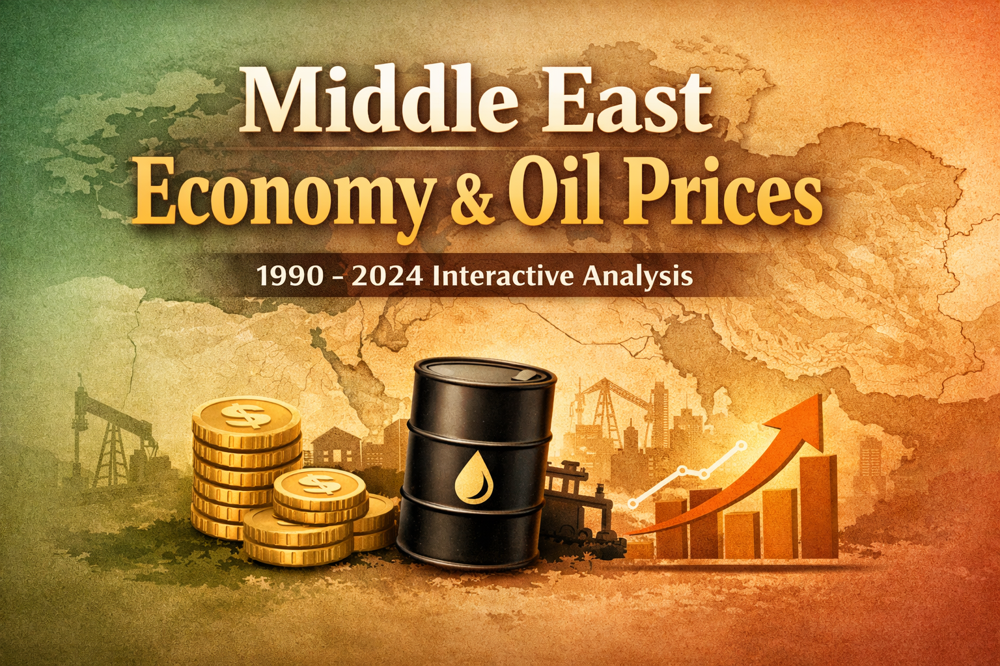

In [1]:
from IPython.display import Image, display
display(Image(filename='/kaggle/input/datasets/mhassansaboor/oil-prices/oil_prices.png'))

# **🌍 Middle East Economy & Oil Prices Analysis (1990–2024)**

Welcome to this **comprehensive economic analysis** of Middle Eastern countries over the past three decades. This notebook explores **GDP, trade, inflation, FDI, unemployment, life expectancy, and oil price impacts**, using interactive and visually engaging plots.

---

## **📊 1️⃣ Data Overview & Cleaning**
- Dataset contains **455 entries** from 1990 to 2024 across **Middle Eastern countries**.
- Checked for **missing values, outliers, and data types**.
- Explored **country-level entries** to confirm panel data completeness.

---

## **📈 2️⃣ Country-Level Economic Trends**
- Tracked **GDP growth, life expectancy, unemployment, and inflation trends** over time.
- Explored **economic development trajectories** for each country.
- Investigated **relationships between oil prices and economic health**.

---

## **🛢 3️⃣ Oil Price Impact Analysis**
- Analyzed correlation between **Brent Oil Price** and:
  - GDP Growth
  - Exports % of GDP
  - FDI Inflows
  - Inflation
  - Unemployment
- Identified **years of oil price shocks**: 1991, 2008, 2014, 2020.
- Compared **oil-rich vs oil-neutral economies** (e.g., KSA vs Lebanon).

---

## **📈 4️⃣ Export & Import Dependency**
- Explored **export-led vs import-heavy economies**.
- Tracked **trade balance shifts** over the years.
- Identified countries **shifting towards export-heavy economies**.

---

## **💰 5️⃣ GDP & Wealth Indicators**
- Examined **GDP per capita growth** and total GDP trends.
- Identified **fastest-growing economies per capita**.
- Highlighted **recession years** via negative GDP growth.

---

## **💸 6️⃣ FDI Inflows**
- Highlighted **top FDI-attracting countries**.
- Studied **impact of oil prices on FDI confidence**.
- Identified major **drops in FDI during wars, sanctions, or instability**.

---

## **📈 7️⃣ Inflation Patterns**
- Detected **years of hyperinflation or deflation**.
- Analyzed **inflation vs GDP growth relationships**.
- Compared **inflation volatility across countries**.

---

## **❤️ 8️⃣ Life Expectancy & Social Development**
- Examined **year-to-year improvements in life expectancy**.
- Compared **life expectancy with GDP per capita** to assess development.
- Highlighted **countries with fastest health improvements**.

---

## **📉 9️⃣ Unemployment Analysis**
- Tracked **long-term unemployment trends**.
- Analyzed **spikes during economic downturns**.
- Compared **unemployment across countries and decades**.

---

## **🧮 10️⃣ Correlation & Heatmap Insights**
- Computed **full correlation matrix for all economic indicators**.
- Highlighted **strongest positive and negative relationships**.
- Focused on **Brent oil price correlations with key indicators**.

---

## **🔗 1️⃣1️⃣ Country-wise Clustering**
- Clustered countries based on:
  - GDP per capita
  - Exports / Imports
  - Unemployment
  - Inflation
  - Oil dependency
- Identified **similar economic groups**: oil-rich, diversified, conflict-affected.

---

## **⚠️ 1️⃣2️⃣ Events & Anomaly Detection**
- Highlighted key **historical events**:
  - 1991 Gulf War
  - 2008 Global Financial Crisis
  - 2014 Oil Price Crash
  - 2020 COVID-19 Oil Collapse
- Analyzed how these events impacted:
  - GDP Growth
  - Inflation
  - FDI
  - Unemployment

---

## **🔹 Summary**
This notebook provides a **detailed, interactive, and visually appealing analysis** of Middle Eastern economies, emphasizing **oil price sensitivity, trade dynamics, and social development indicators**. All plots use a **consistent earth-tone theme** for clarity and coherence.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import warnings

In [3]:
warnings.filterwarnings('ignore')

# ============================================
# GLOBAL NOTEBOOK THEME (Earth-Tone Economic Theme)
# ============================================

# ---- Background Colors ----
plt.rcParams['figure.facecolor'] = '#F7F4EE'     # light cream
plt.rcParams['axes.facecolor']   = '#FAF8F2'     # slightly lighter cream
plt.rcParams['savefig.facecolor'] = '#F7F4EE'

# ---- Grid, Axes & Spines ----
plt.rcParams['axes.edgecolor'] = '#6B5E54'        # muted brown/olive
plt.rcParams['axes.labelcolor'] = '#3E3A36'       # dark natural
plt.rcParams['xtick.color'] = '#3E3A36'
plt.rcParams['ytick.color'] = '#3E3A36'
plt.rcParams['grid.color'] = '#C9C3BA'            # warm light gray
plt.rcParams['grid.linestyle'] = '--'
plt.rcParams['axes.grid'] = True

# ---- Font ----
plt.rcParams['font.size'] = 12
plt.rcParams['font.family'] = 'DejaVu Sans'

# ---- Line & Marker Colors (Earth Tone Palette) ----
earth_palette = [
    '#8DAA91',  # Sage Green
    '#C7B198',  # Sand
    '#D6C9B8',  # Wheat
    '#A47551',  # Clay Brown
    '#6B705C',  # Moss Green
    '#B7B7A4',  # Dust Gray
    '#CB997E',  # Desert Clay
    '#FFE8D6',  # Light Peach
]

sns.set_palette(earth_palette)

# ---- Seaborn Global Style ----
sns.set_style("whitegrid", {
    'axes.facecolor': '#FAF8F2',
    'figure.facecolor': '#F7F4EE',
    'grid.color': '#C9C3BA'
})

print("🎨 Earth-tone theme successfully applied to entire notebook!")

🎨 Earth-tone theme successfully applied to entire notebook!


In [4]:
df = pd.read_csv("/kaggle/input/datasets/meharshanali/middle-east-economy-and-oil-prices-19902024/Middle_East_Economic_Data_1990_2024_with_Oil.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 455 entries, 0 to 454
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Country                               455 non-null    object 
 1   Country_Code                          455 non-null    object 
 2   Year                                  455 non-null    int64  
 3   Exports_pct_GDP                       429 non-null    float64
 4   FDI_net_inflows_pct_GDP               446 non-null    float64
 5   GDP_current_USD                       448 non-null    float64
 6   GDP_growth_annual_pct                 447 non-null    float64
 7   GDP_per_capita_current_USD            448 non-null    float64
 8   Imports_pct_GDP                       429 non-null    float64
 9   Inflation_consumer_prices_annual_pct  395 non-null    float64
 10  Life_expectancy_years                 442 non-null    float64
 11  Unemployment_total_

In [5]:
df['Country'].value_counts()

Country
Bahrain                 35
Egypt                   35
Iran                    35
Iraq                    35
Israel                  35
Jordan                  35
Kuwait                  35
Lebanon                 35
Oman                    35
Qatar                   35
Saudi Arabia            35
United Arab Emirates    35
Yemen                   35
Name: count, dtype: int64

In [6]:
# ======================================================
# REMOVE ISRAEL FROM DATASET
# ======================================================
df = df[df["Country"] != "Israel"].reset_index(drop=True)

# **EDA**

# **1️⃣ Data Overview & Structure**

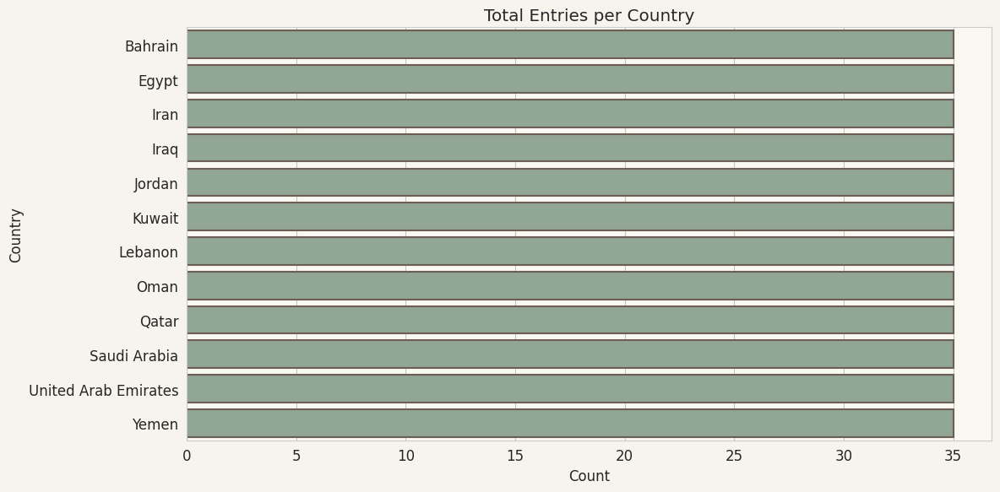

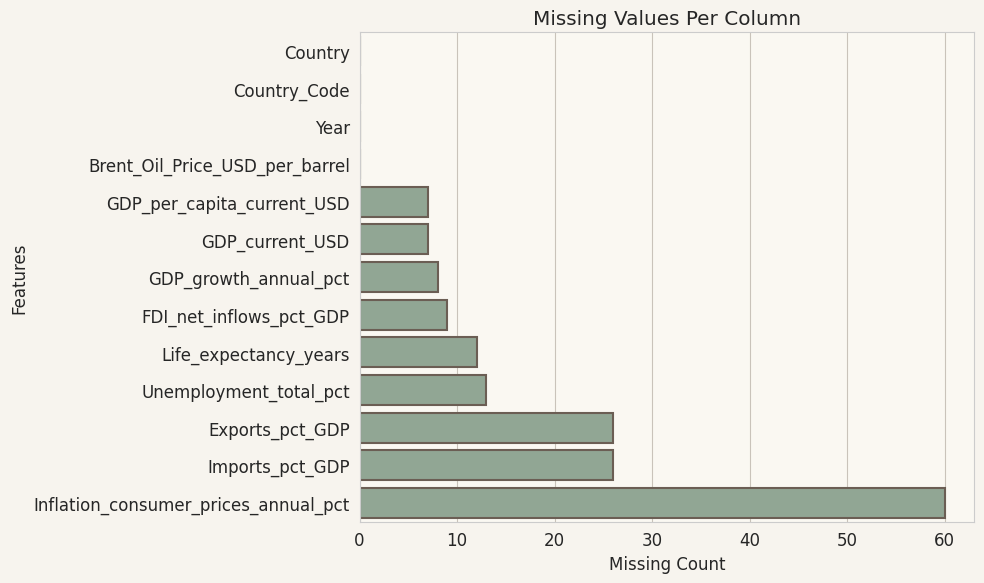

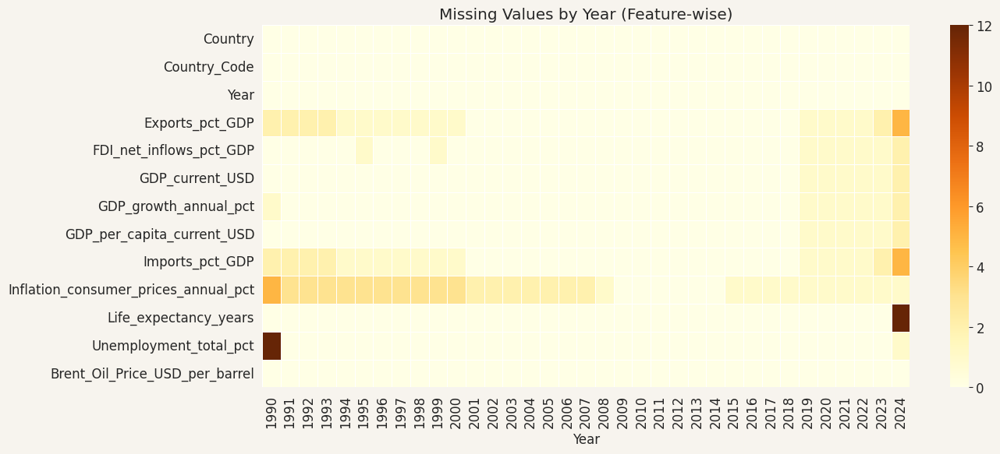

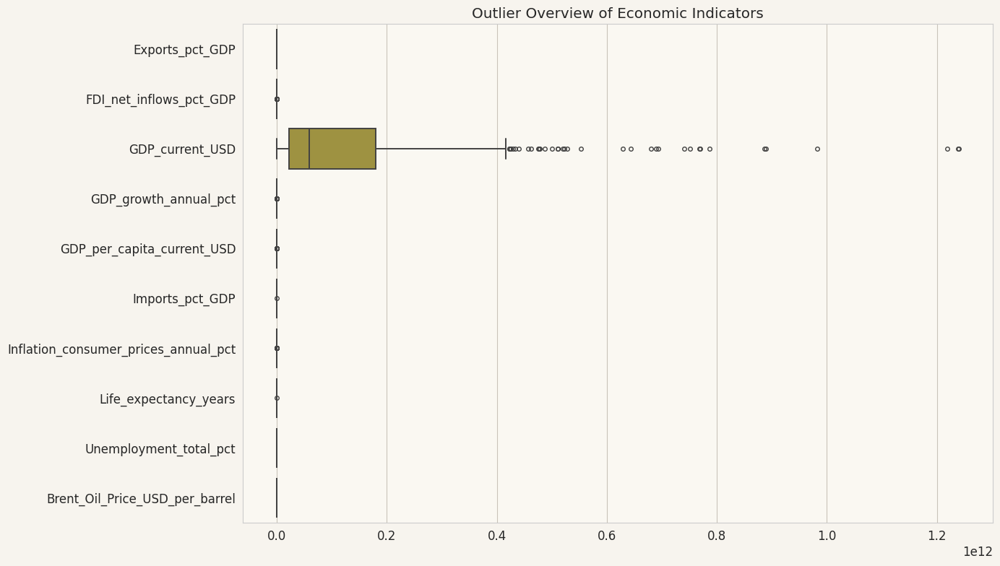

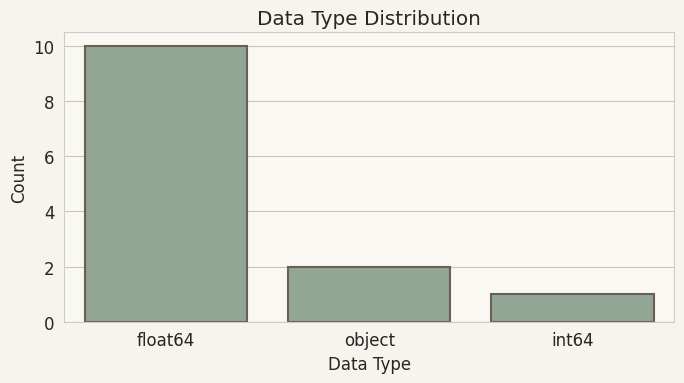

In [7]:
# ================================================
# 1️⃣ TOTAL ENTRIES PER COUNTRY
# ================================================
country_counts = df['Country'].value_counts()

plt.figure(figsize=(12,6))
sns.barplot(
    y=country_counts.index,
    x=country_counts.values,
    linewidth=1.5,
    edgecolor="#6B5E54"
)
plt.title("Total Entries per Country")
plt.xlabel("Count")
plt.ylabel("Country")
plt.tight_layout()
plt.show()


# ================================================
# 2️⃣ MISSING VALUES BY VARIABLE
# ================================================
missing_values = df.isnull().sum().sort_values(ascending=True)

plt.figure(figsize=(10,6))
sns.barplot(
    x=missing_values.values,
    y=missing_values.index,
    linewidth=1.5,
    edgecolor="#6B5E54"
)
plt.title("Missing Values Per Column")
plt.xlabel("Missing Count")
plt.ylabel("Features")
plt.tight_layout()
plt.show()


# ================================================
# 3️⃣ MISSING VALUES HEATMAP BY YEAR
# ================================================
missing_by_year = df.groupby("Year").apply(lambda x: x.isnull().sum())

plt.figure(figsize=(14,6))
sns.heatmap(
    missing_by_year.T,
    cmap="YlOrBr",
    cbar=True,
    linewidths=.5
)
plt.title("Missing Values by Year (Feature-wise)")
plt.tight_layout()
plt.show()


# ================================================
# 4️⃣ OUTLIER DETECTION (BOXPLOTS)
# ================================================

numeric_cols = [
    'Exports_pct_GDP', 'FDI_net_inflows_pct_GDP', 'GDP_current_USD',
    'GDP_growth_annual_pct', 'GDP_per_capita_current_USD',
    'Imports_pct_GDP', 'Inflation_consumer_prices_annual_pct',
    'Life_expectancy_years', 'Unemployment_total_pct',
    'Brent_Oil_Price_USD_per_barrel'
]

plt.figure(figsize=(14,8))
sns.boxplot(
    data=df[numeric_cols],
    orient='h',
    linewidth=1.4,
    whis=1.5,
    fliersize=4
)
plt.title("Outlier Overview of Economic Indicators")
plt.tight_layout()
plt.show()


# ================================================
# 5️⃣ DATA TYPES VALIDATION (BAR PLOT)
# ================================================
dtype_counts = df.dtypes.value_counts()

plt.figure(figsize=(7,4))
sns.barplot(
    x=dtype_counts.index.astype(str),
    y=dtype_counts.values,
    edgecolor="#6B5E54",
    linewidth=1.5
)
plt.title("Data Type Distribution")
plt.xlabel("Data Type")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

# 2️⃣ Country-Level Economic Trends (Time-Series Insights)

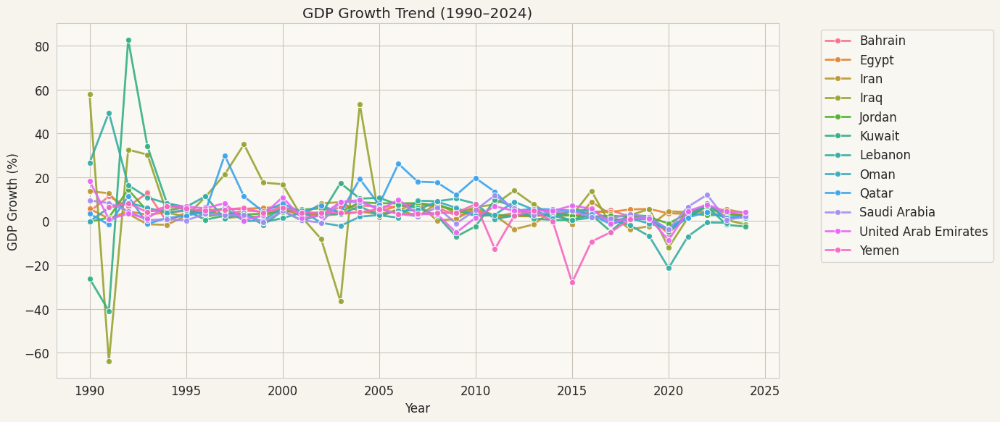

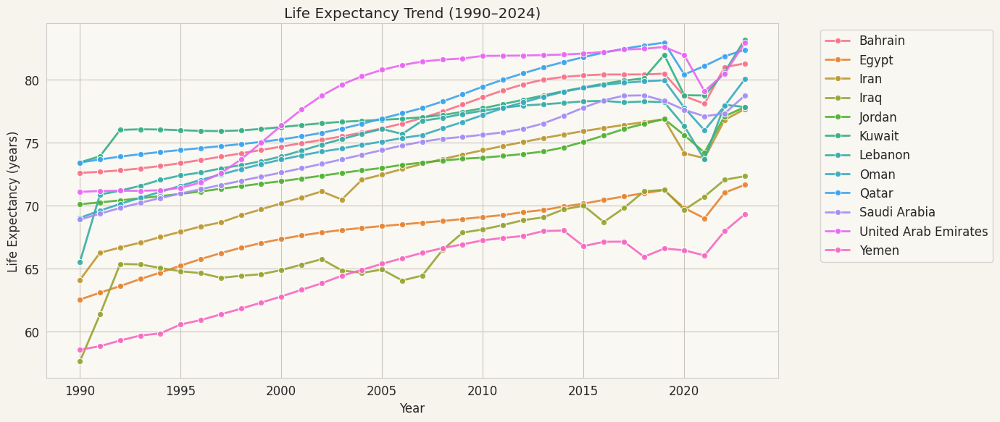

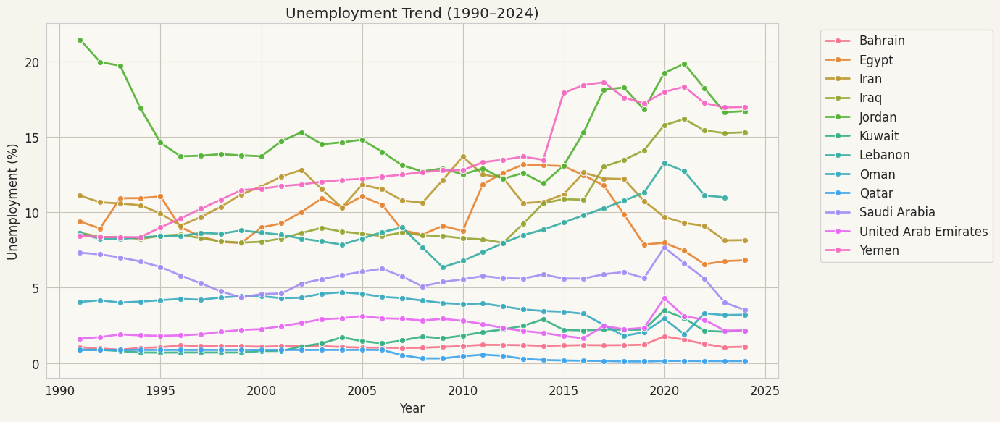

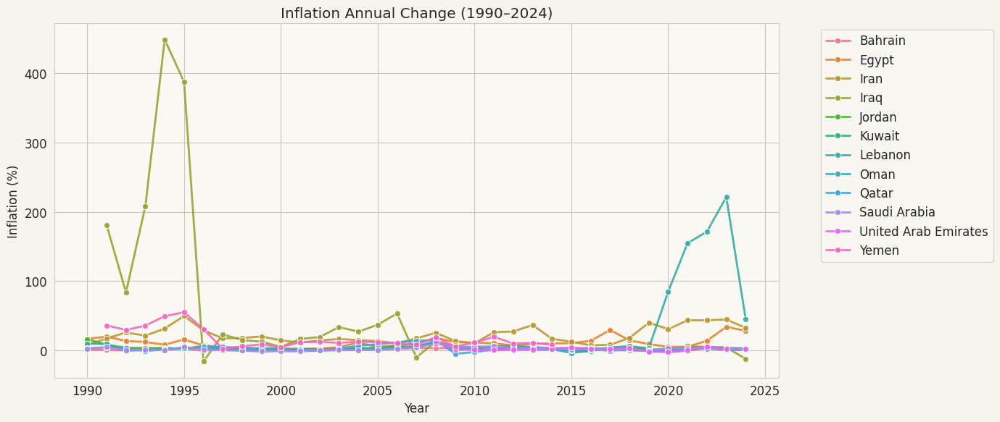

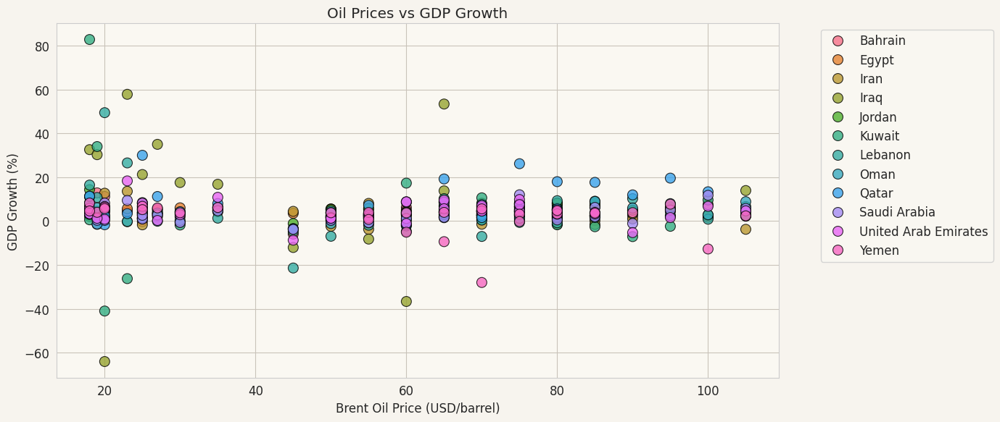

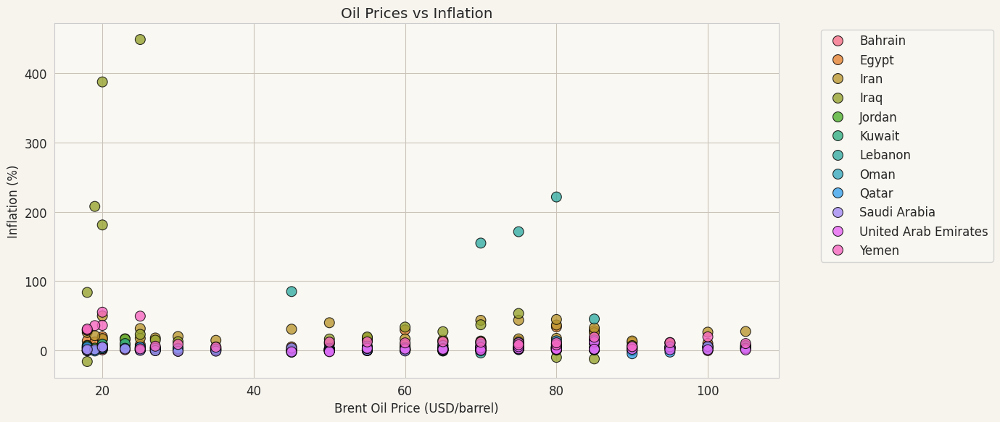

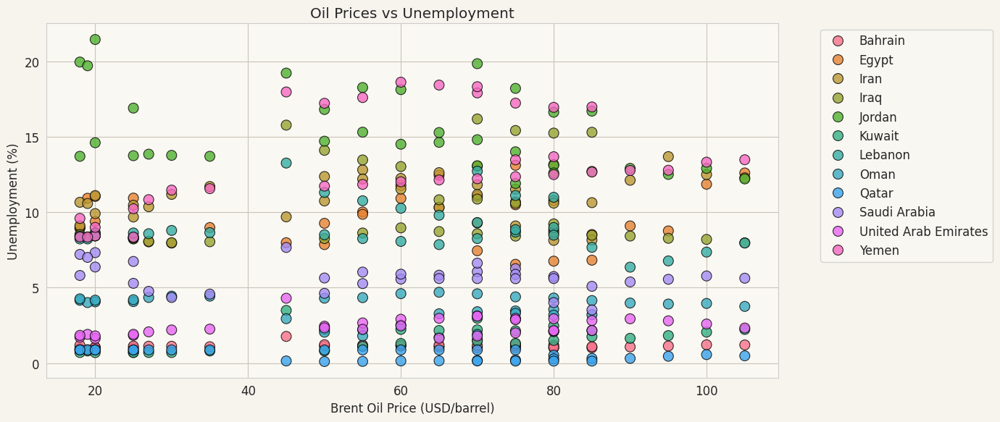

In [8]:
# ================================
# 1️⃣ GDP Growth Trend by Country
# ================================
plt.figure(figsize=(14,6))
sns.lineplot(
    data=df,
    x="Year",
    y="GDP_growth_annual_pct",
    hue="Country",
    marker="o",
    linewidth=2,
    alpha=0.9
)
plt.title("GDP Growth Trend (1990–2024)")
plt.ylabel("GDP Growth (%)")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ======================================
# 2️⃣ Life Expectancy Trend by Country
# ======================================
plt.figure(figsize=(14,6))
sns.lineplot(
    data=df,
    x="Year",
    y="Life_expectancy_years",
    hue="Country",
    marker="o",
    linewidth=2,
    alpha=0.9
)
plt.title("Life Expectancy Trend (1990–2024)")
plt.ylabel("Life Expectancy (years)")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ======================================
# 3️⃣ Unemployment Trend by Country
# ======================================
plt.figure(figsize=(14,6))
sns.lineplot(
    data=df,
    x="Year",
    y="Unemployment_total_pct",
    hue="Country",
    marker="o",
    linewidth=2,
    alpha=0.9
)
plt.title("Unemployment Trend (1990–2024)")
plt.ylabel("Unemployment (%)")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ======================================
# 4️⃣ Inflation Stability / Volatility
# ======================================
plt.figure(figsize=(14,6))
sns.lineplot(
    data=df,
    x="Year",
    y="Inflation_consumer_prices_annual_pct",
    hue="Country",
    marker="o",
    linewidth=2,
    alpha=0.9
)
plt.title("Inflation Annual Change (1990–2024)")
plt.ylabel("Inflation (%)")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ======================================================
# 5️⃣ Oil Price vs GDP Growth (Economic Sensitivity)
# ======================================================
plt.figure(figsize=(14,6))
sns.scatterplot(
    data=df,
    x="Brent_Oil_Price_USD_per_barrel",
    y="GDP_growth_annual_pct",
    hue="Country",
    alpha=0.8,
    s=100,
    edgecolor="black"
)
plt.title("Oil Prices vs GDP Growth")
plt.xlabel("Brent Oil Price (USD/barrel)")
plt.ylabel("GDP Growth (%)")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ======================================================
# 6️⃣ Oil Price vs Inflation (Oil-driven inflation spikes)
# ======================================================
plt.figure(figsize=(14,6))
sns.scatterplot(
    data=df,
    x="Brent_Oil_Price_USD_per_barrel",
    y="Inflation_consumer_prices_annual_pct",
    hue="Country",
    alpha=0.8,
    s=100,
    edgecolor="black"
)
plt.title("Oil Prices vs Inflation")
plt.xlabel("Brent Oil Price (USD/barrel)")
plt.ylabel("Inflation (%)")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ======================================================
# 7️⃣ Oil Price vs Unemployment (Economic Pressure)
# ======================================================
plt.figure(figsize=(14,6))
sns.scatterplot(
    data=df,
    x="Brent_Oil_Price_USD_per_barrel",
    y="Unemployment_total_pct",
    hue="Country",
    alpha=0.8,
    s=100,
    edgecolor="black"
)
plt.title("Oil Prices vs Unemployment")
plt.xlabel("Brent Oil Price (USD/barrel)")
plt.ylabel("Unemployment (%)")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# **3️⃣ Oil Price Impact Analysis (Major Part of Notebook)**

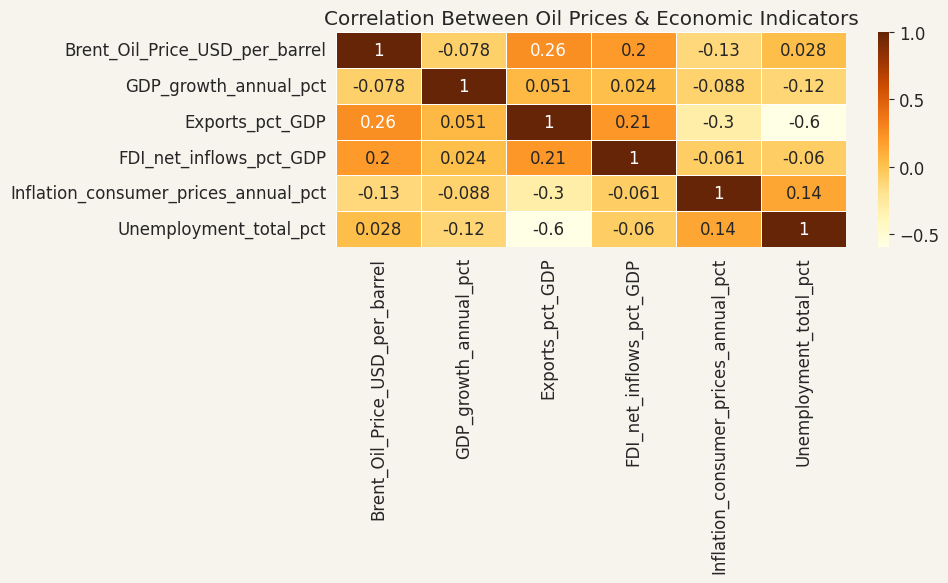

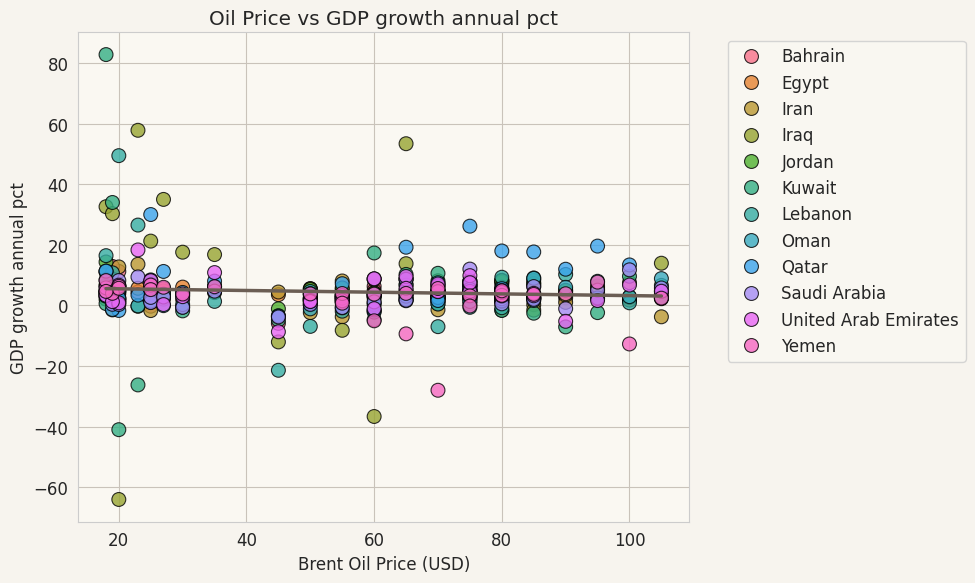

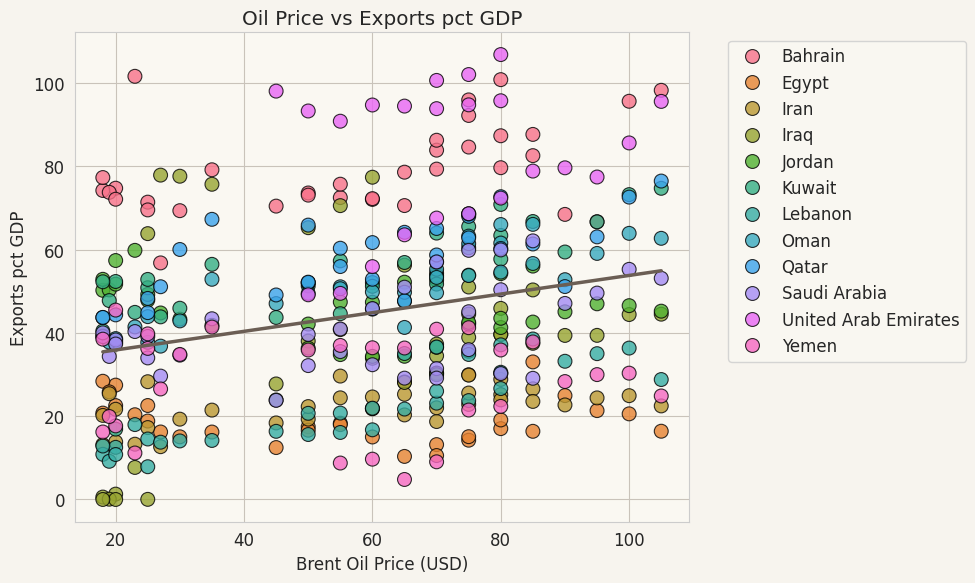

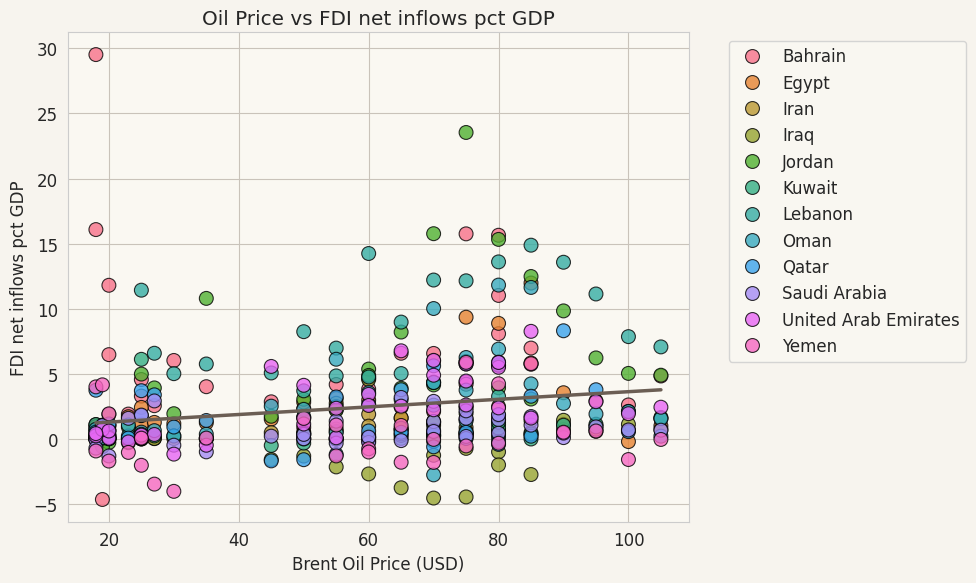

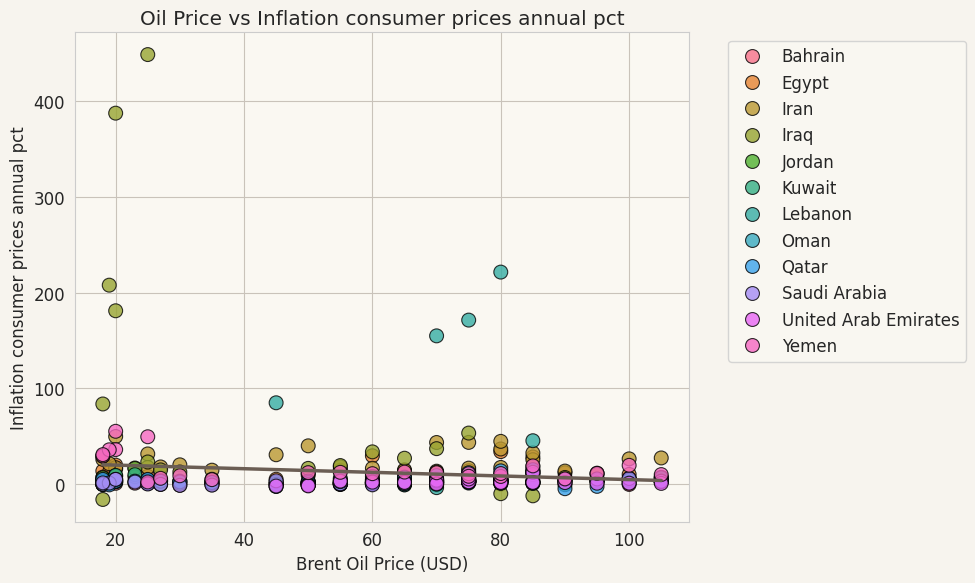

...

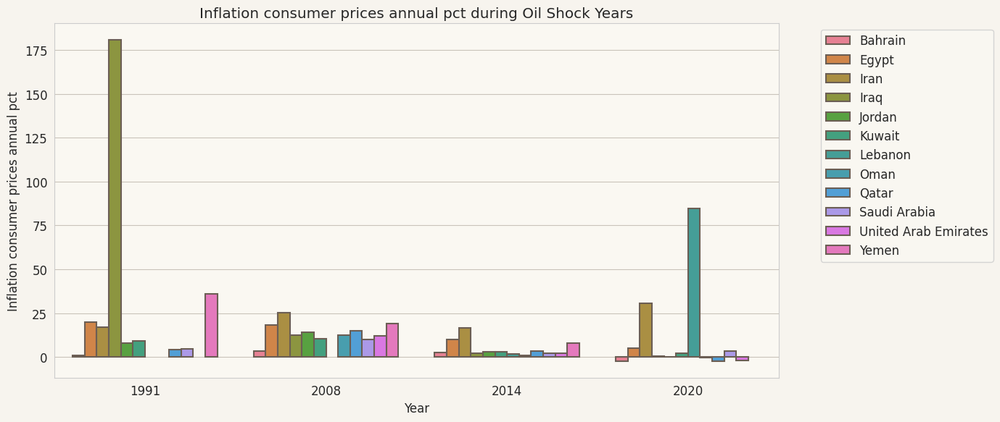

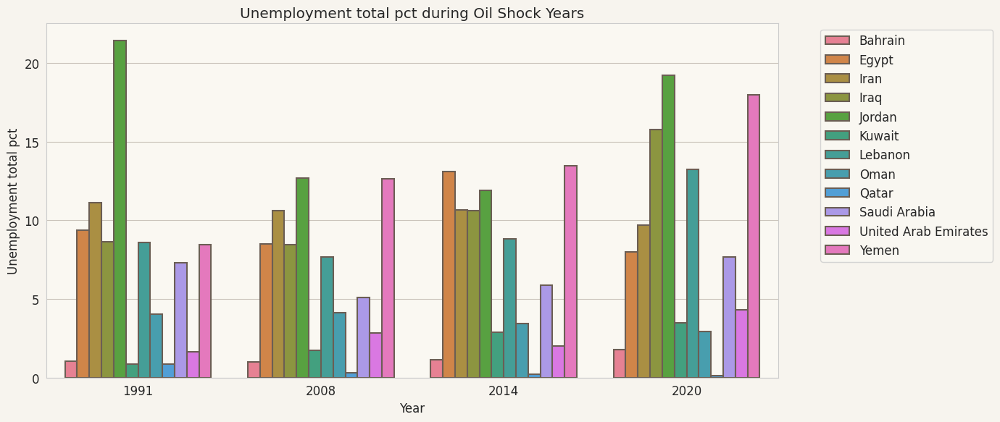

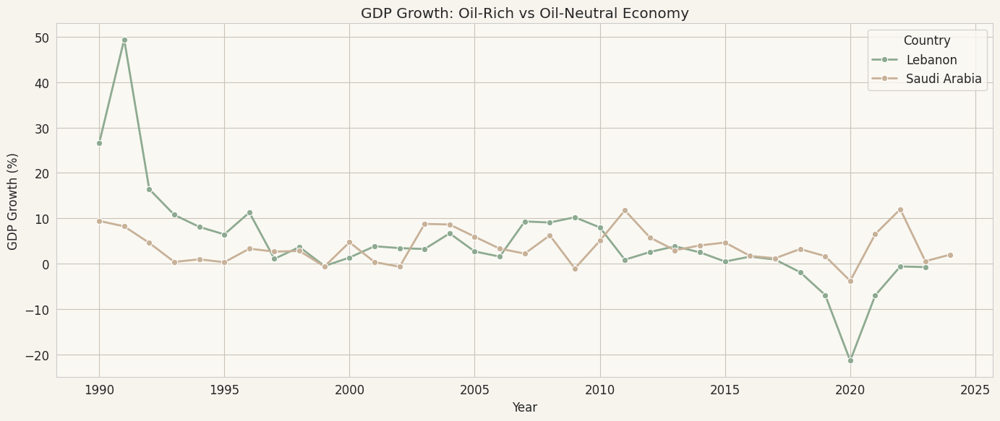

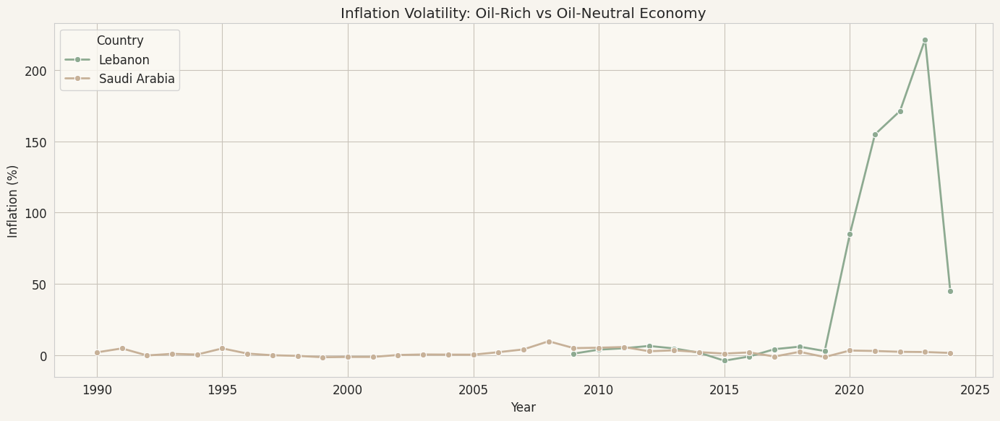

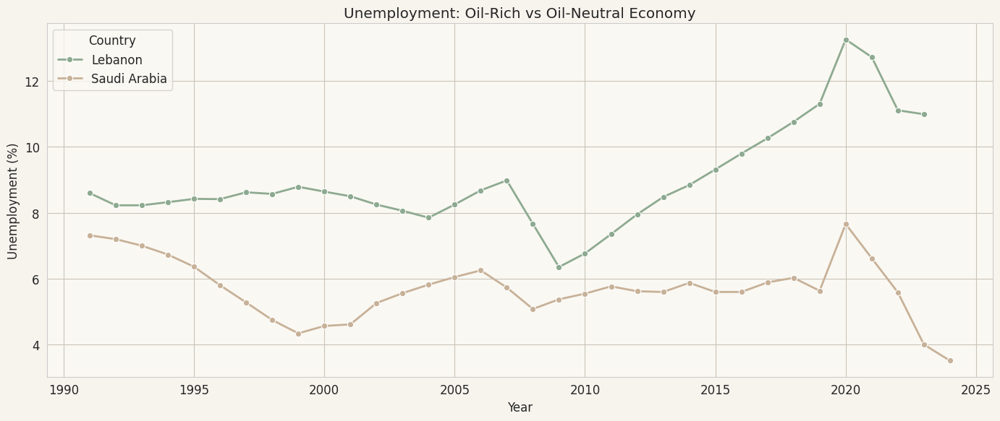

,Country,Metric,Correlation
0,Bahrain,GDP_growth_annual_pct,-0.112131
1,Egypt,GDP_growth_annual_pct,-0.112615
2,Iran,GDP_growth_annual_pct,-0.161701
3,Iraq,GDP_growth_annual_pct,-0.135719
4,Jordan,GDP_growth_annual_pct,-0.031756


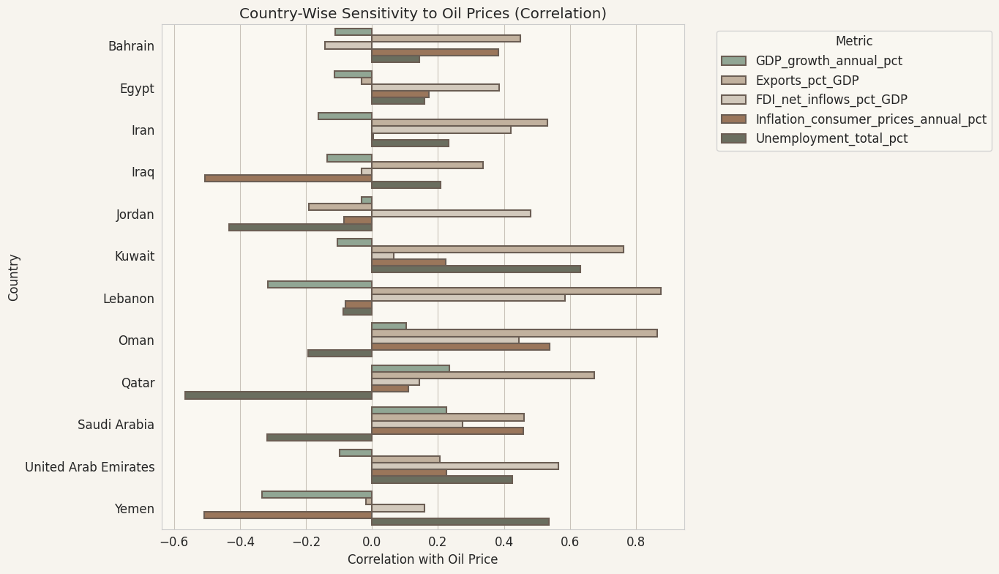

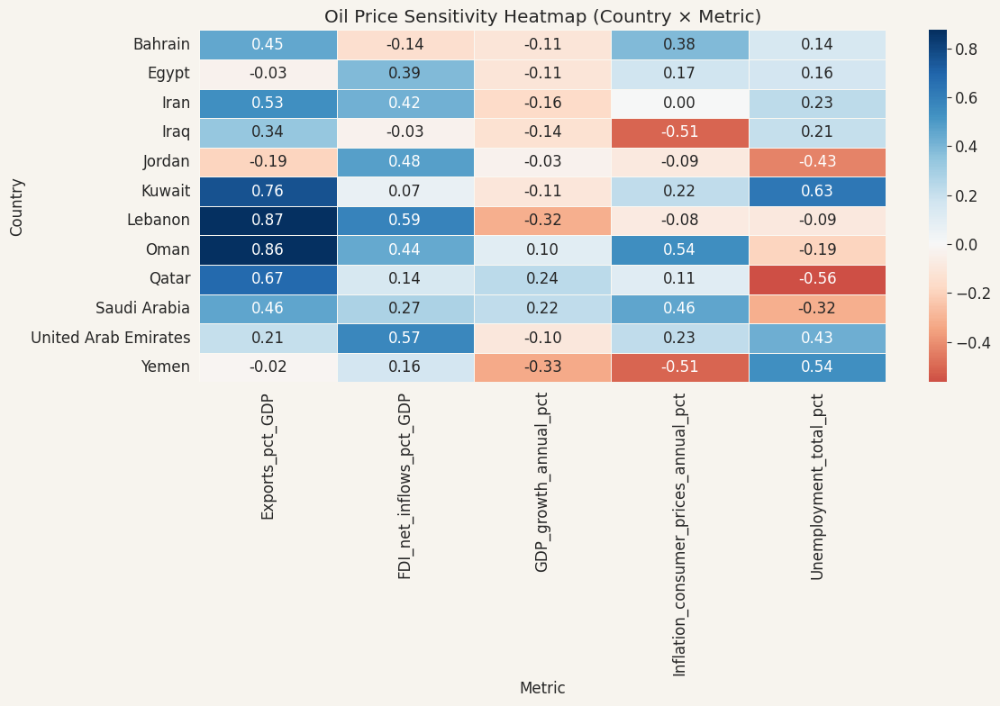

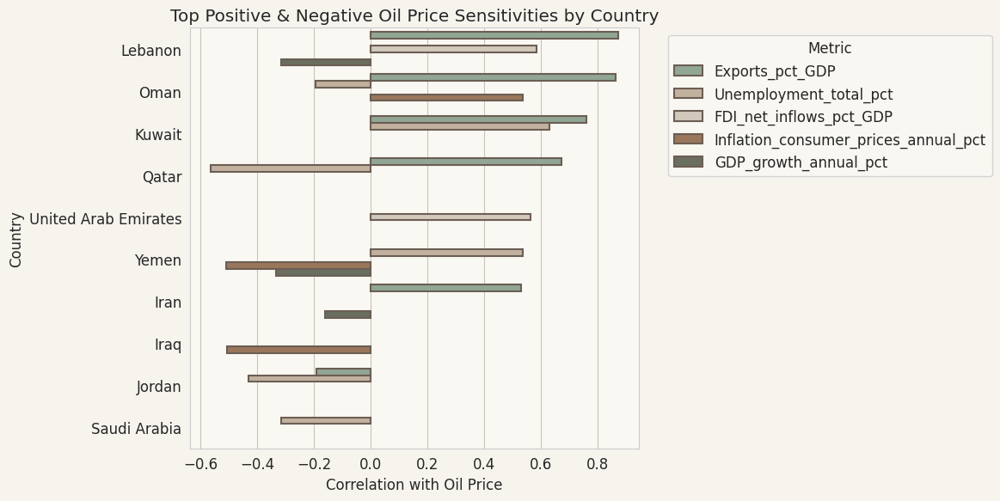

In [9]:
df = df.sort_values(["Country", "Year"])
oil = "Brent_Oil_Price_USD_per_barrel"

# ======================================================
# 1️⃣ CORRELATION BETWEEN OIL PRICE & ECONOMIC METRICS
# ======================================================

oil_corr_cols = [
    "GDP_growth_annual_pct",
    "Exports_pct_GDP",
    "FDI_net_inflows_pct_GDP",
    "Inflation_consumer_prices_annual_pct",
    "Unemployment_total_pct"
]

corr_df = df[[oil] + oil_corr_cols].corr()

plt.figure(figsize=(10,6))
sns.heatmap(corr_df, annot=True, cmap="YlOrBr", linewidths=.5)
plt.title("Correlation Between Oil Prices & Economic Indicators")
plt.tight_layout()
plt.show()


# ======================================================
# 2️⃣ INTERACTIVE-STYLE SCATTER + REGRESSION FOR EACH METRIC
# ======================================================

for col in oil_corr_cols:
    plt.figure(figsize=(10,6))
    sns.scatterplot(
        data=df,
        x=oil,
        y=col,
        hue="Country",
        alpha=0.8,
        s=100,
        edgecolor="black"
    )
    sns.regplot(
        data=df,
        x=oil,
        y=col,
        scatter=False,
        ci=None,
        color="#6B5E54",
        line_kws={"linewidth":2.5}
    )
    plt.title(f"Oil Price vs {col.replace('_',' ')}")
    plt.xlabel("Brent Oil Price (USD)")
    plt.ylabel(col.replace("_", " "))
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()


# ======================================================
# 3️⃣ OIL SHOCK YEARS — MARKED ON OIL PRICE TREND
# ======================================================

oil_shocks = [1991, 2008, 2014, 2020]

plt.figure(figsize=(14,6))
sns.lineplot(
    data=df,
    x="Year",
    y=oil,
    marker="o",
    linewidth=2,
    alpha=0.9,
    color="#6B705C"
)
for shock in oil_shocks:
    price = df[df["Year"] == shock][oil].mean()
    plt.axvline(shock, color="red", linestyle="--", alpha=0.7)
    plt.text(shock+0.1, price, f"Shock {shock}", color="red")

plt.title("Oil Price Trend with Major Shock Years")
plt.ylabel("Brent Oil Price (USD)")
plt.tight_layout()
plt.show()


# ======================================================
# 4️⃣ HOW COUNTRIES REACTED DURING OIL SHOCK YEARS
# GDP, Inflation, Unemployment
# ======================================================

shock_df = df[df["Year"].isin(oil_shocks)]

metrics = [
    "GDP_growth_annual_pct",
    "Inflation_consumer_prices_annual_pct",
    "Unemployment_total_pct"
]

for metric in metrics:
    plt.figure(figsize=(14,6))
    sns.barplot(
        data=shock_df,
        x="Year",
        y=metric,
        hue="Country",
        linewidth=1.5,
        edgecolor="#6B5E54"
    )
    plt.title(f"{metric.replace('_',' ')} during Oil Shock Years")
    plt.ylabel(metric.replace("_"," "))
    plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
    plt.tight_layout()
    plt.show()


# ======================================================
# 5️⃣ COMPARISON: OIL-RICH vs OIL-NEUTRAL COUNTRY
# Example: Saudi Arabia vs Lebanon
# ======================================================

target_rich = "Saudi Arabia"    # change if dataset uses different naming
target_neutral = "Lebanon"

rich_vs_neutral_df = df[df["Country"].isin([target_rich, target_neutral])]

plt.figure(figsize=(14,6))
sns.lineplot(
    data=rich_vs_neutral_df,
    x="Year",
    y="GDP_growth_annual_pct",
    hue="Country",
    marker="o",
    linewidth=2
)
plt.title("GDP Growth: Oil-Rich vs Oil-Neutral Economy")
plt.ylabel("GDP Growth (%)")
plt.tight_layout()
plt.show()

plt.figure(figsize=(14,6))
sns.lineplot(
    data=rich_vs_neutral_df,
    x="Year",
    y="Inflation_consumer_prices_annual_pct",
    hue="Country",
    marker="o",
    linewidth=2
)
plt.title("Inflation Volatility: Oil-Rich vs Oil-Neutral Economy")
plt.ylabel("Inflation (%)")
plt.tight_layout()
plt.show()

plt.figure(figsize=(14,6))
sns.lineplot(
    data=rich_vs_neutral_df,
    x="Year",
    y="Unemployment_total_pct",
    hue="Country",
    marker="o",
    linewidth=2
)
plt.title("Unemployment: Oil-Rich vs Oil-Neutral Economy")
plt.ylabel("Unemployment (%)")
plt.tight_layout()
plt.show()


# ======================================================
# 6️⃣ OIL PRICE SENSITIVITY (COUNTRY-WISE CORRELATION)
# ======================================================

oil = "Brent_Oil_Price_USD_per_barrel"

# ------------------------------------------------------
# (A) COMPUTE COUNTRY-WISE CORRELATION WITH OIL PRICE
# ------------------------------------------------------

# Compute correlation of oil price with each metric per country
corr_df = (
    df.groupby("Country")
      .apply(lambda x: x[[oil] + oil_corr_cols].corr()[oil].drop(oil))
      .reset_index()
)

# Melt into long format for plotting
sensitivity = corr_df.melt(
    id_vars="Country",
    var_name="Metric",
    value_name="Correlation"
)

# Ensure numeric
sensitivity["Correlation"] = pd.to_numeric(sensitivity["Correlation"], errors="coerce")

# Quick check
display(sensitivity.head())

# ------------------------------------------------------
# (B) BAR PLOT — Country-wise Correlation by Metric
# ------------------------------------------------------

plt.figure(figsize=(14,8))
sns.barplot(
    data=sensitivity,
    x="Correlation",
    y="Country",
    hue="Metric",
    linewidth=1.5,
    edgecolor="#6B5E54"
)
plt.title("Country-Wise Sensitivity to Oil Prices (Correlation)")
plt.xlabel("Correlation with Oil Price")
plt.ylabel("Country")
plt.legend(title="Metric", bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# ------------------------------------------------------
# (C) HEATMAP — Oil Sensitivity (Country × Metric)
# ------------------------------------------------------

pivot_sens = sensitivity.pivot(index="Country", columns="Metric", values="Correlation")

plt.figure(figsize=(12,8))
sns.heatmap(
    pivot_sens,
    cmap="RdBu",
    center=0,
    annot=True,
    fmt=".2f",
    linewidths=.5,
    linecolor="#FAF8F2"
)
plt.title("Oil Price Sensitivity Heatmap (Country × Metric)")
plt.tight_layout()
plt.show()

# ------------------------------------------------------
# (D) HORIZONTAL BAR — Top Positive & Negative Sensitivities
# ------------------------------------------------------

# Top 10 positive and negative correlations
top_pos = sensitivity.sort_values("Correlation", ascending=False).head(10)
top_neg = sensitivity.sort_values("Correlation", ascending=True).head(10)

plt.figure(figsize=(12,6))
sns.barplot(
    data=pd.concat([top_pos, top_neg]),
    x="Correlation",
    y="Country",
    hue="Metric",
    linewidth=1.5,
    edgecolor="#6B5E54"
)
plt.title("Top Positive & Negative Oil Price Sensitivities by Country")
plt.xlabel("Correlation with Oil Price")
plt.ylabel("Country")
plt.legend(title="Metric", bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# **4️⃣ Export & Import Dependency**

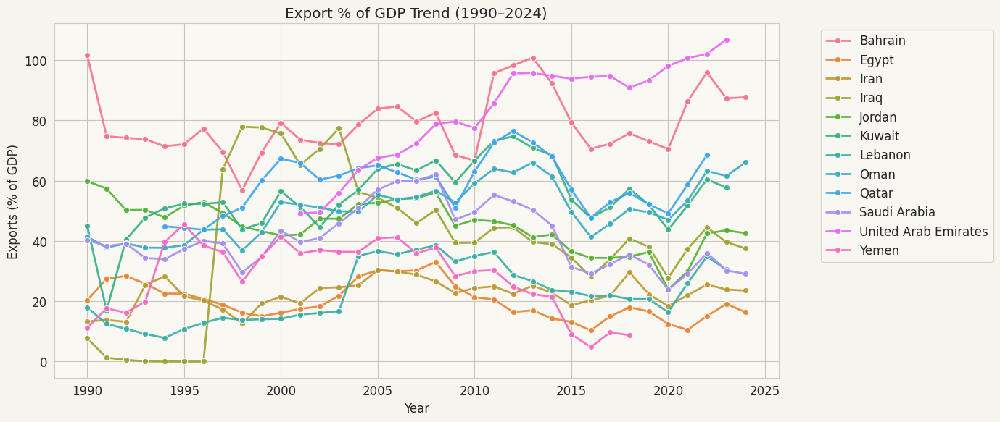

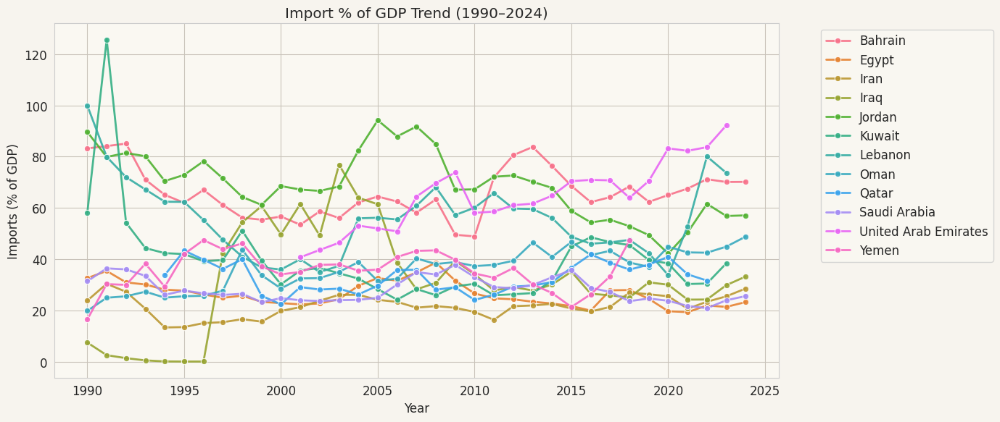

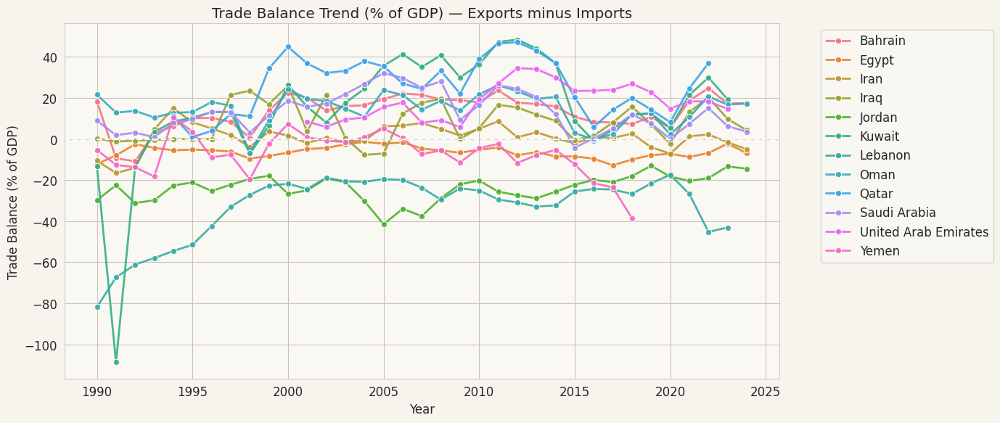

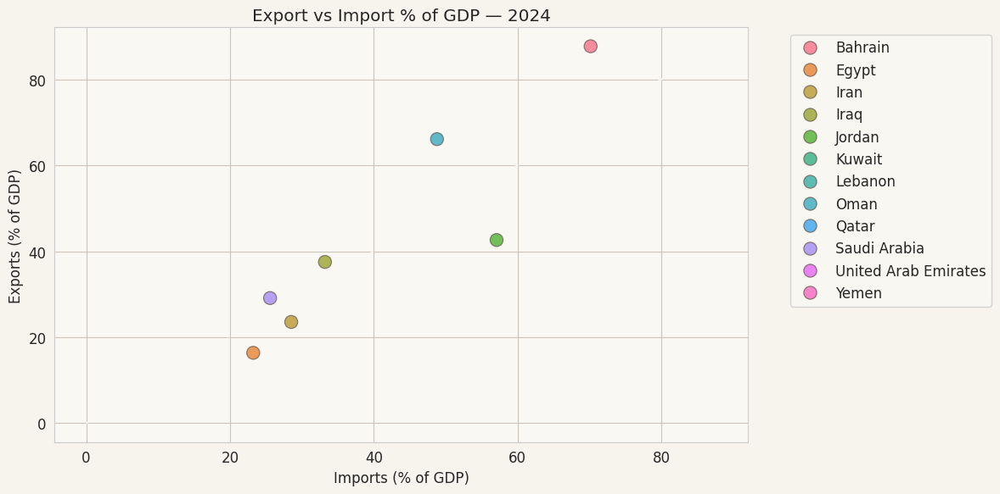

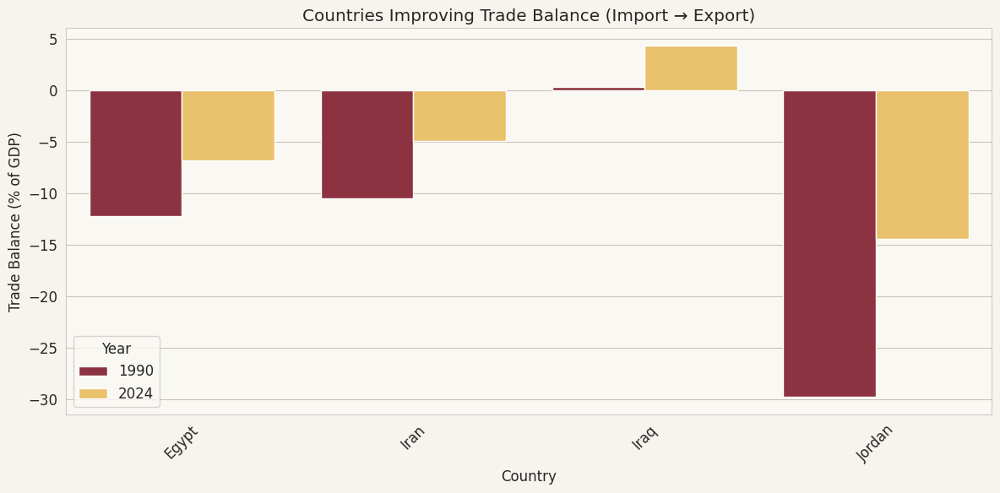

In [10]:
# Ensure the dataframe is sorted properly
df_sorted = df.sort_values(["Country", "Year"])

# ------------------------------------------------------
# (A) EXPORT % OF GDP TREND — Country-wise
# ------------------------------------------------------
plt.figure(figsize=(14,6))
sns.lineplot(
    data=df_sorted,
    x="Year",
    y="Exports_pct_GDP",
    hue="Country",
    marker="o",
    linewidth=2,
    alpha=0.9
)
plt.title("Export % of GDP Trend (1990–2024)")
plt.ylabel("Exports (% of GDP)")
plt.xlabel("Year")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# ------------------------------------------------------
# (B) IMPORT % OF GDP TREND — Country-wise
# ------------------------------------------------------
plt.figure(figsize=(14,6))
sns.lineplot(
    data=df_sorted,
    x="Year",
    y="Imports_pct_GDP",
    hue="Country",
    marker="o",
    linewidth=2,
    alpha=0.9
)
plt.title("Import % of GDP Trend (1990–2024)")
plt.ylabel("Imports (% of GDP)")
plt.xlabel("Year")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# ------------------------------------------------------
# (C) TRADE BALANCE — EXPORTS VS IMPORTS
# ------------------------------------------------------
df_sorted["Trade_Balance_pct_GDP"] = df_sorted["Exports_pct_GDP"] - df_sorted["Imports_pct_GDP"]

plt.figure(figsize=(14,6))
sns.lineplot(
    data=df_sorted,
    x="Year",
    y="Trade_Balance_pct_GDP",
    hue="Country",
    marker="o",
    linewidth=2,
    alpha=0.9
)
plt.axhline(0, color="#FAF8F2", linestyle="--")  # Zero balance line
plt.title("Trade Balance Trend (% of GDP) — Exports minus Imports")
plt.ylabel("Trade Balance (% of GDP)")
plt.xlabel("Year")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# ------------------------------------------------------
# (D) EXPORT vs IMPORT COMPARISON — LAST YEAR
# ------------------------------------------------------
last_year = df_sorted["Year"].max()
df_last = df_sorted[df_sorted["Year"] == last_year]

plt.figure(figsize=(12,6))
sns.scatterplot(
    data=df_last,
    x="Imports_pct_GDP",
    y="Exports_pct_GDP",
    hue="Country",
    s=120,
    edgecolor="#6B5E54",
    alpha=0.8
)
plt.plot([0, df_last[["Exports_pct_GDP","Imports_pct_GDP"]].max().max()],
         [0, df_last[["Exports_pct_GDP","Imports_pct_GDP"]].max().max()],
         color="#FAF8F2", linestyle="--", linewidth=1.5)  # Diagonal line y=x
plt.title(f"Export vs Import % of GDP — {last_year}")
plt.xlabel("Imports (% of GDP)")
plt.ylabel("Exports (% of GDP)")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# ======================================================
# (E) COUNTRIES SHIFTING TOWARDS EXPORT-HEAVY
# ======================================================
start_year = df_sorted["Year"].min()
last_year = df_sorted["Year"].max()

# Compute trade balance if not already done
if "Trade_Balance_pct_GDP" not in df_sorted.columns:
    df_sorted["Trade_Balance_pct_GDP"] = df_sorted["Exports_pct_GDP"] - df_sorted["Imports_pct_GDP"]

# Select only start and end year
df_shift = df_sorted[df_sorted["Year"].isin([start_year, last_year])]
trade_shift = df_shift.pivot(index="Country", columns="Year", values="Trade_Balance_pct_GDP").dropna()

# Filter countries with an improvement in trade balance
shift_countries = trade_shift[trade_shift[last_year] > trade_shift[start_year]]

if shift_countries.empty:
    print("No countries show a positive improvement in trade balance from start to end year.")
else:
    plt.figure(figsize=(12,6))
    sns.barplot(
        data=shift_countries.reset_index().melt(id_vars="Country", var_name="Year", value_name="Trade_Balance"),
        x="Country",
        y="Trade_Balance",
        hue="Year",
        palette=["#9B2335", "#FFC857"]
    )
    plt.title("Countries Improving Trade Balance (Import → Export)")
    plt.ylabel("Trade Balance (% of GDP)")
    plt.xlabel("Country")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# **5️⃣ GDP & Wealth Indicators**

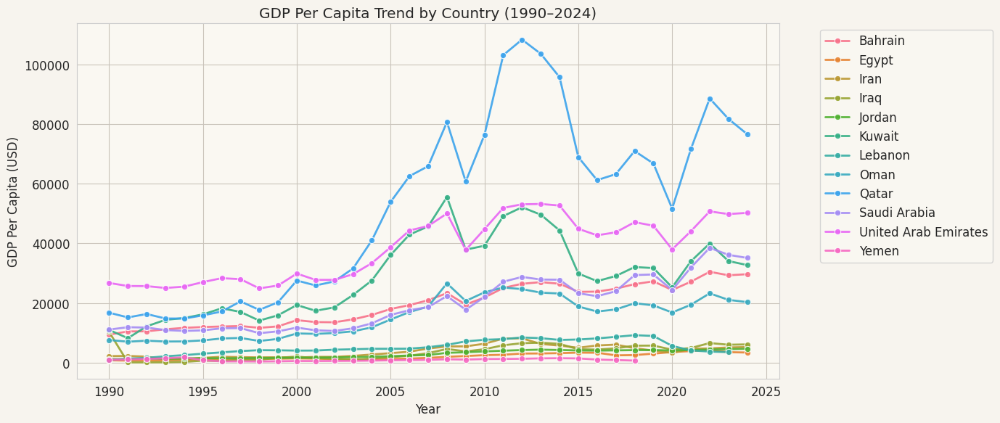

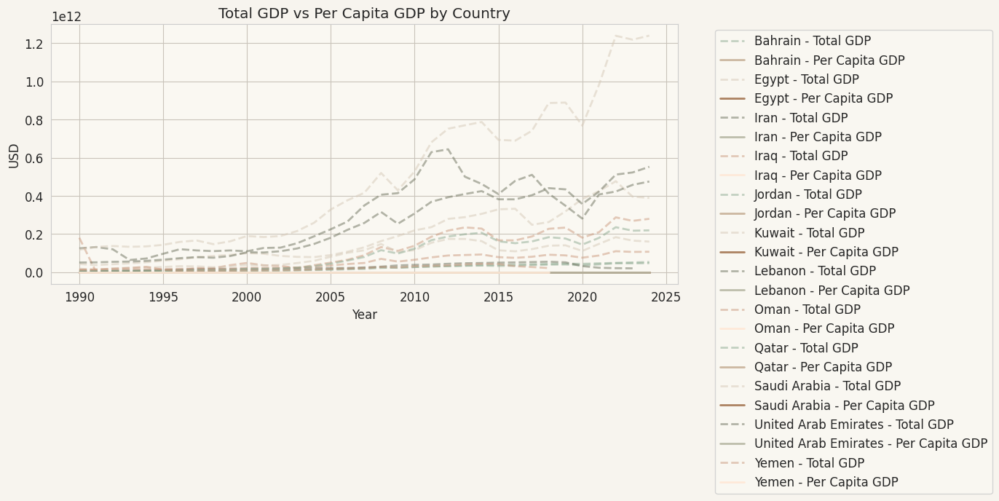

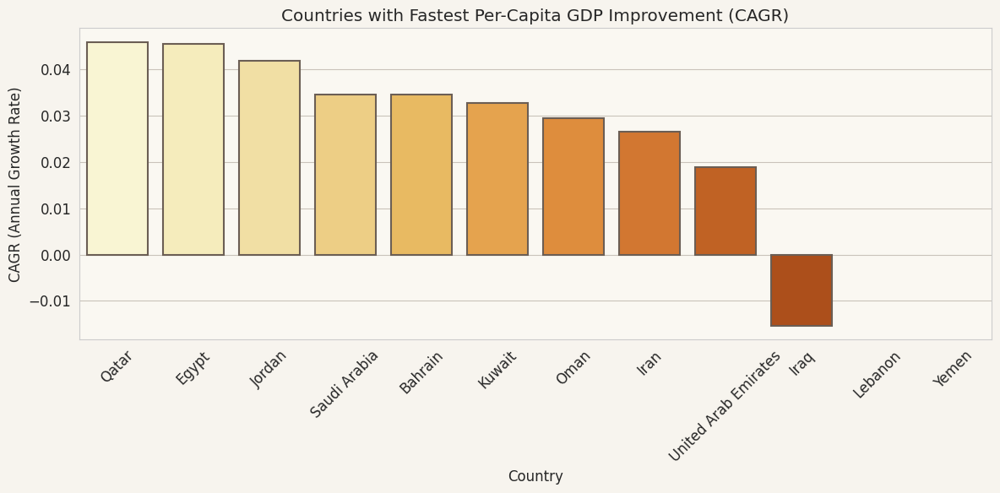

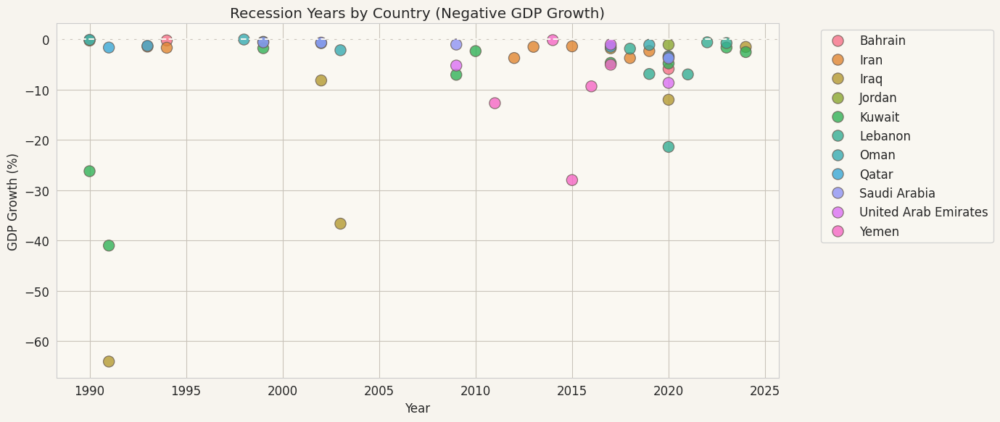

In [11]:
# ======================================================
# (A) GDP PER CAPITA GROWTH TREND — Country-wise
# ======================================================
plt.figure(figsize=(14,6))
sns.lineplot(
    data=df_sorted,
    x="Year",
    y="GDP_per_capita_current_USD",
    hue="Country",
    marker="o",
    linewidth=2,
    alpha=0.9
)
plt.title("GDP Per Capita Trend by Country (1990–2024)")
plt.ylabel("GDP Per Capita (USD)")
plt.xlabel("Year")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# ======================================================
# (B) TOTAL GDP vs PER CAPITA GDP (Population Effect)
# ======================================================
plt.figure(figsize=(14,6))
for country in df_sorted["Country"].unique():
    country_df = df_sorted[df_sorted["Country"] == country]
    plt.plot(
        country_df["Year"],
        country_df["GDP_current_USD"],
        label=f"{country} - Total GDP",
        alpha=0.5,
        linewidth=2,
        linestyle="--"
    )
    plt.plot(
        country_df["Year"],
        country_df["GDP_per_capita_current_USD"],
        label=f"{country} - Per Capita GDP",
        alpha=0.9,
        linewidth=2
    )
plt.title("Total GDP vs Per Capita GDP by Country")
plt.xlabel("Year")
plt.ylabel("USD")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left", ncol=1)
plt.tight_layout()
plt.show()

# ======================================================
# (C) FASTEST PER-CAPITA IMPROVEMENT
# ======================================================
# Compute CAGR (Compound Annual Growth Rate) for each country
import numpy as np

cagr_list = []
for country in df_sorted["Country"].unique():
    country_df = df_sorted[df_sorted["Country"] == country].sort_values("Year")
    start_val = country_df["GDP_per_capita_current_USD"].iloc[0]
    end_val = country_df["GDP_per_capita_current_USD"].iloc[-1]
    n_years = country_df["Year"].iloc[-1] - country_df["Year"].iloc[0]
    if start_val > 0 and n_years > 0:
        cagr = (end_val / start_val) ** (1/n_years) - 1
        cagr_list.append({"Country": country, "PerCapita_CAGR": cagr})
        
cagr_df = pd.DataFrame(cagr_list).sort_values("PerCapita_CAGR", ascending=False)

plt.figure(figsize=(12,6))
sns.barplot(
    data=cagr_df,
    x="Country",
    y="PerCapita_CAGR",
    palette="YlOrBr",
    edgecolor="#6B5E54",
    linewidth=1.5
)
plt.title("Countries with Fastest Per-Capita GDP Improvement (CAGR)")
plt.ylabel("CAGR (Annual Growth Rate)")
plt.xlabel("Country")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# ======================================================
# (D) DETECT RECESSION YEARS (NEGATIVE GDP GROWTH)
# ======================================================
recession_df = df_sorted[df_sorted["GDP_growth_annual_pct"] < 0]

plt.figure(figsize=(14,6))
sns.scatterplot(
    data=recession_df,
    x="Year",
    y="GDP_growth_annual_pct",
    hue="Country",
    s=120,
    alpha=0.8,
    edgecolor="#6B5E54"
)
plt.axhline(0, color="#FAF8F2", linestyle="--", linewidth=1.5)
plt.title("Recession Years by Country (Negative GDP Growth)")
plt.ylabel("GDP Growth (%)")
plt.xlabel("Year")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# **6️⃣ FDI Inflows (Foreign Direct Investment)**

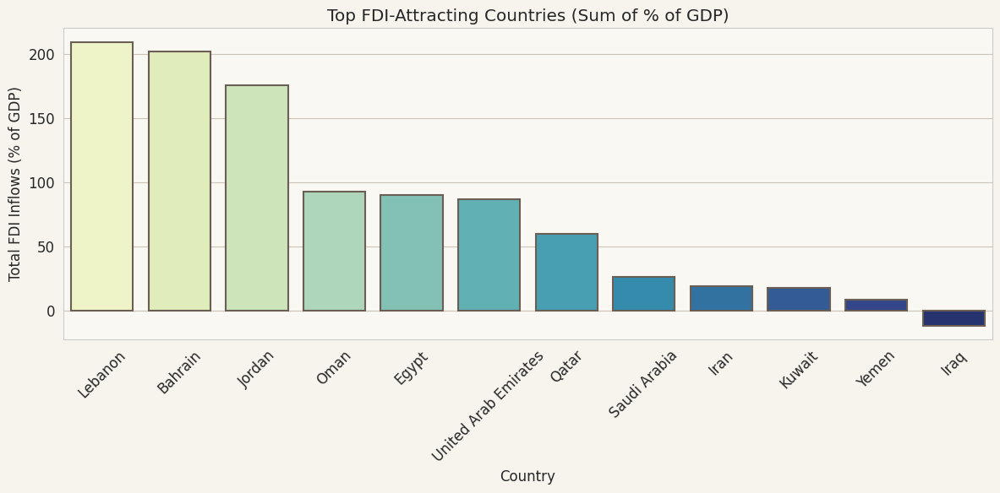

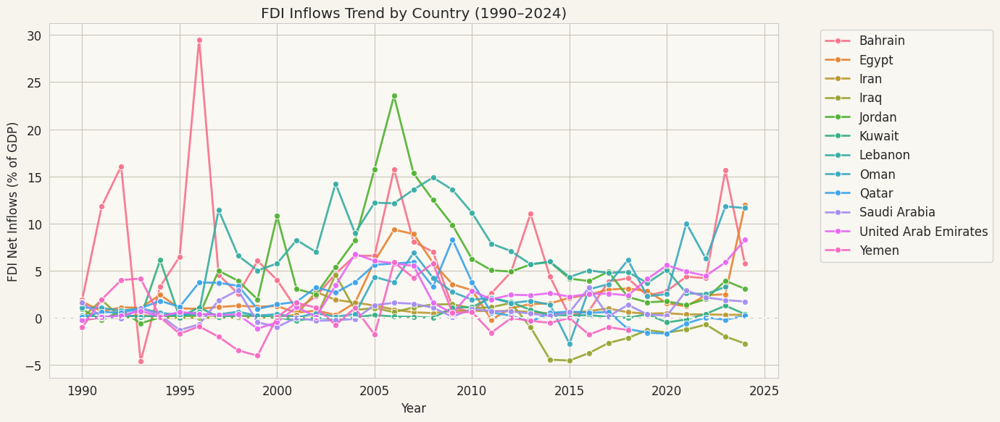

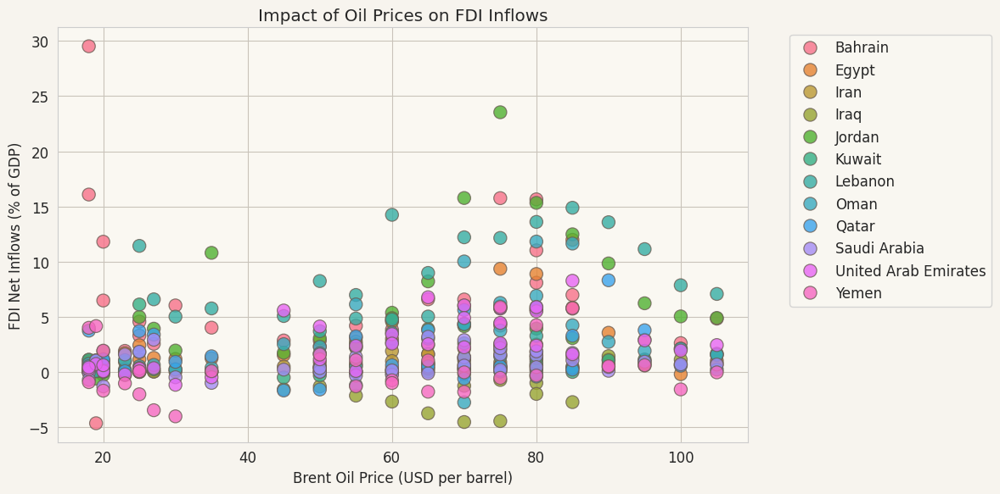

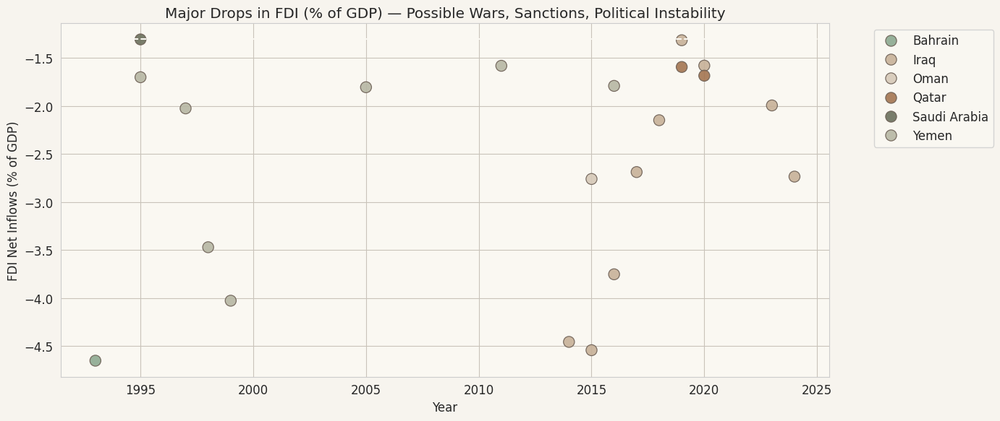

In [12]:
# ------------------------------------------------------
# (A) TOP FDI-ATTRACTING COUNTRIES (TOTAL FDI)
# ------------------------------------------------------
# Sum FDI inflows per country
fdi_total = df_sorted.groupby("Country")["FDI_net_inflows_pct_GDP"].sum().reset_index()
fdi_total = fdi_total.sort_values("FDI_net_inflows_pct_GDP", ascending=False)

plt.figure(figsize=(12,6))
sns.barplot(
    data=fdi_total,
    x="Country",
    y="FDI_net_inflows_pct_GDP",
    palette="YlGnBu",
    edgecolor="#6B5E54",
    linewidth=1.5
)
plt.title("Top FDI-Attracting Countries (Sum of % of GDP)")
plt.ylabel("Total FDI Inflows (% of GDP)")
plt.xlabel("Country")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# ------------------------------------------------------
# (B) FDI TREND BY COUNTRY OVER YEARS
# ------------------------------------------------------
plt.figure(figsize=(14,6))
sns.lineplot(
    data=df_sorted,
    x="Year",
    y="FDI_net_inflows_pct_GDP",
    hue="Country",
    marker="o",
    linewidth=2,
    alpha=0.9
)
plt.title("FDI Inflows Trend by Country (1990–2024)")
plt.ylabel("FDI Net Inflows (% of GDP)")
plt.xlabel("Year")
plt.axhline(0, color="#FAF8F2", linestyle="--", linewidth=1.5)
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# ------------------------------------------------------
# (C) IMPACT OF OIL PRICES ON FDI (CORRELATION SCATTER)
# ------------------------------------------------------
plt.figure(figsize=(12,6))
sns.scatterplot(
    data=df_sorted,
    x="Brent_Oil_Price_USD_per_barrel",
    y="FDI_net_inflows_pct_GDP",
    hue="Country",
    s=120,
    alpha=0.8,
    edgecolor="#6B5E54"
)
plt.title("Impact of Oil Prices on FDI Inflows")
plt.xlabel("Brent Oil Price (USD per barrel)")
plt.ylabel("FDI Net Inflows (% of GDP)")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# ------------------------------------------------------
# (D) MAJOR DROPS IN FDI (NEGATIVE OR LOW VALUES)
# ------------------------------------------------------
# Identify years where FDI < 0 or significantly low (<5th percentile)
low_fdi_threshold = df_sorted["FDI_net_inflows_pct_GDP"].quantile(0.05)
fdi_drops = df_sorted[df_sorted["FDI_net_inflows_pct_GDP"] < low_fdi_threshold]

plt.figure(figsize=(14,6))
sns.scatterplot(
    data=fdi_drops,
    x="Year",
    y="FDI_net_inflows_pct_GDP",
    hue="Country",
    s=120,
    alpha=0.9,
    edgecolor="#6B5E54"
)
plt.axhline(low_fdi_threshold, color="#FAF8F2", linestyle="--", linewidth=1.5)
plt.title("Major Drops in FDI (% of GDP) — Possible Wars, Sanctions, Political Instability")
plt.xlabel("Year")
plt.ylabel("FDI Net Inflows (% of GDP)")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# **7️⃣ Inflation Patterns**

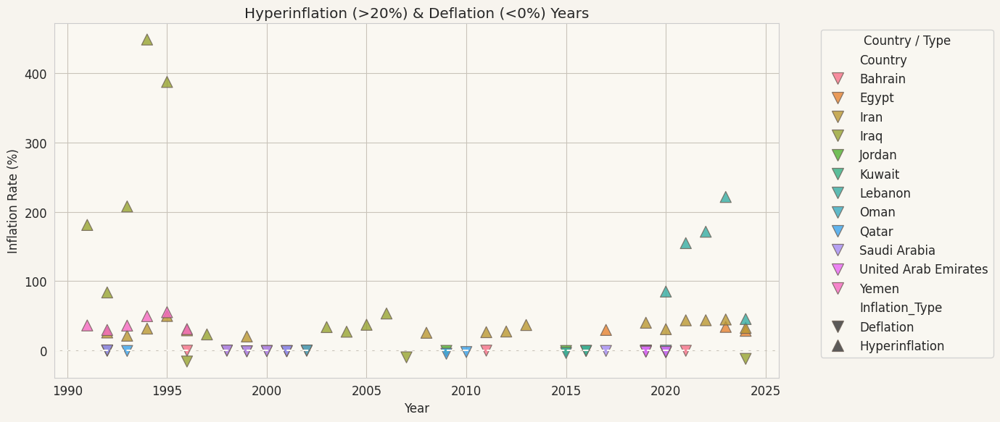

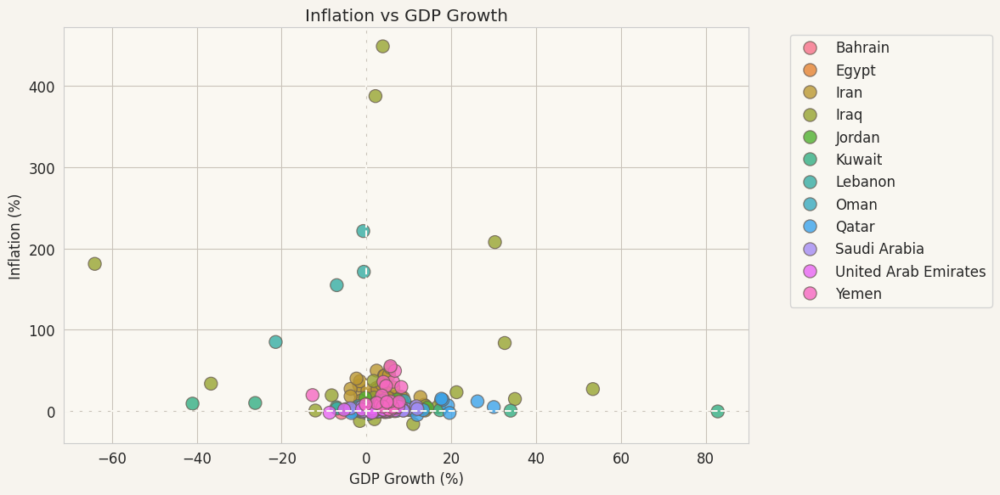

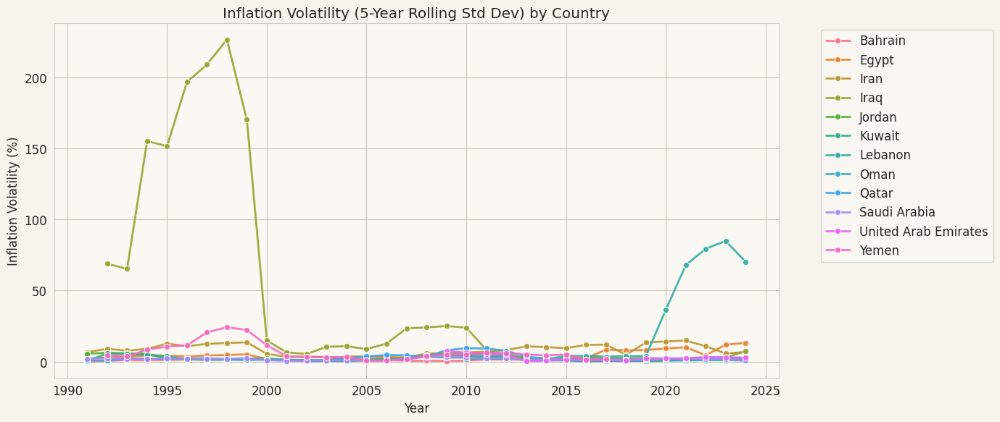

In [13]:
# ------------------------------------------------------
# (A) HYPERINFLATION OR DEFLATION YEARS — FIXED
# ------------------------------------------------------
hyperinflation_threshold = 20
deflation_threshold = 0

df_sorted["Inflation_Type"] = "Normal"
df_sorted.loc[df_sorted["Inflation_consumer_prices_annual_pct"] > hyperinflation_threshold, "Inflation_Type"] = "Hyperinflation"
df_sorted.loc[df_sorted["Inflation_consumer_prices_annual_pct"] < deflation_threshold, "Inflation_Type"] = "Deflation"

plt.figure(figsize=(14,6))
sns.scatterplot(
    data=df_sorted[df_sorted["Inflation_Type"] != "Normal"],
    x="Year",
    y="Inflation_consumer_prices_annual_pct",
    hue="Country",
    style="Inflation_Type",
    s=120,
    edgecolor="#6B5E54",
    alpha=0.8,
    markers={"Hyperinflation":"^","Deflation":"v"}
)
plt.axhline(0, color="#FAF8F2", linestyle="--", linewidth=1.5)
plt.title("Hyperinflation (>20%) & Deflation (<0%) Years")
plt.ylabel("Inflation Rate (%)")
plt.xlabel("Year")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left", title="Country / Type")
plt.tight_layout()
plt.show()

# ======================================================
# (B) RELATIONSHIP BETWEEN INFLATION AND GDP GROWTH
# ======================================================
plt.figure(figsize=(12,6))
sns.scatterplot(
    data=df_sorted,
    x="GDP_growth_annual_pct",
    y="Inflation_consumer_prices_annual_pct",
    hue="Country",
    s=120,
    alpha=0.8,
    edgecolor="#6B5E54"
)
plt.axhline(0, color="#FAF8F2", linestyle="--", linewidth=1.5)
plt.axvline(0, color="#FAF8F2", linestyle="--", linewidth=1.5)
plt.title("Inflation vs GDP Growth")
plt.xlabel("GDP Growth (%)")
plt.ylabel("Inflation (%)")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# ======================================================
# (C) INFLATION VOLATILITY COMPARISON
# ======================================================
# Compute rolling standard deviation over 5-year window as volatility
vol_df = df_sorted.copy()
vol_df["Inflation_volatility"] = vol_df.groupby("Country")["Inflation_consumer_prices_annual_pct"].transform(lambda x: x.rolling(5, min_periods=1).std())

plt.figure(figsize=(14,6))
sns.lineplot(
    data=vol_df,
    x="Year",
    y="Inflation_volatility",
    hue="Country",
    marker="o",
    linewidth=2,
    alpha=0.9
)
plt.title("Inflation Volatility (5-Year Rolling Std Dev) by Country")
plt.ylabel("Inflation Volatility (%)")
plt.xlabel("Year")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# **8️⃣ Life Expectancy & Social Development**

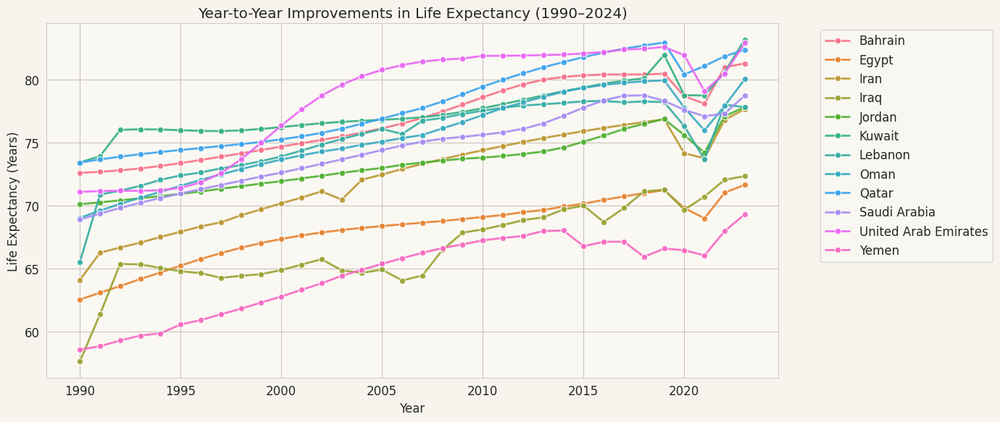

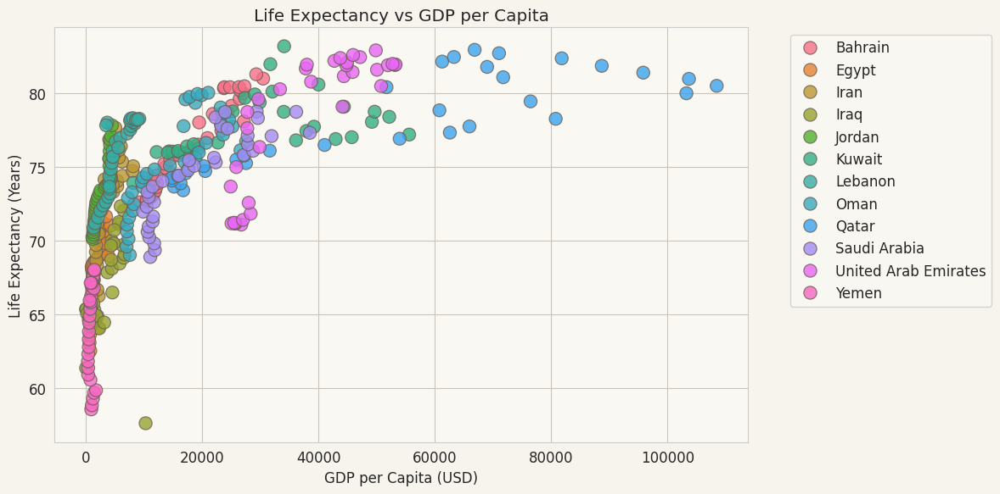

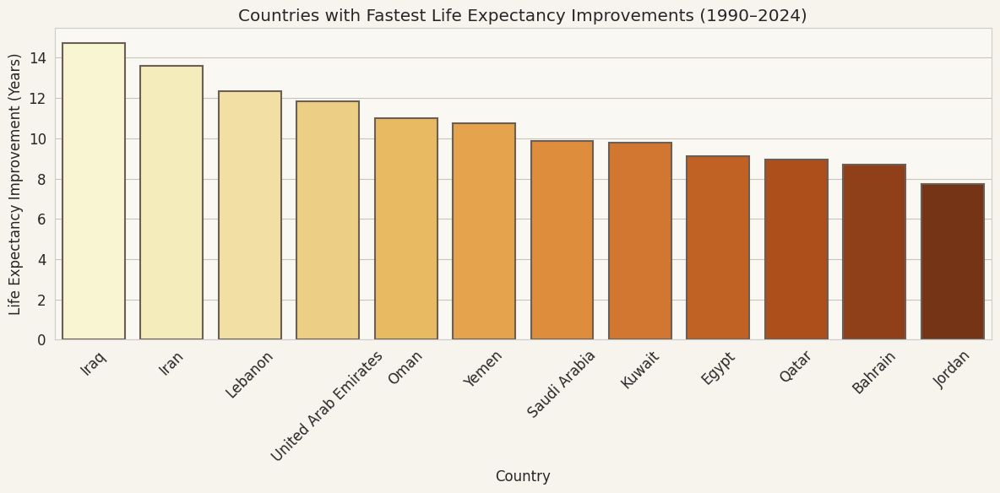

In [14]:
# ======================================================
# (A) LIFE EXPECTANCY IMPROVEMENTS — YEAR-TO-YEAR
# ======================================================
plt.figure(figsize=(14,6))
sns.lineplot(
    data=df_sorted,
    x="Year",
    y="Life_expectancy_years",
    hue="Country",
    marker="o",
    linewidth=2,
    alpha=0.9
)
plt.title("Year-to-Year Improvements in Life Expectancy (1990–2024)")
plt.ylabel("Life Expectancy (Years)")
plt.xlabel("Year")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# ======================================================
# (B) LIFE EXPECTANCY vs GDP PER CAPITA
# ======================================================
plt.figure(figsize=(12,6))
sns.scatterplot(
    data=df_sorted,
    x="GDP_per_capita_current_USD",
    y="Life_expectancy_years",
    hue="Country",
    s=120,
    alpha=0.8,
    edgecolor="#6B5E54"
)
plt.title("Life Expectancy vs GDP per Capita")
plt.xlabel("GDP per Capita (USD)")
plt.ylabel("Life Expectancy (Years)")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# ======================================================
# (C) COUNTRIES WITH FASTEST HEALTH IMPROVEMENTS — FIXED
# ======================================================
improvement_list = []

for country in df_sorted["Country"].unique():
    country_df = df_sorted[df_sorted["Country"] == country].sort_values("Year")
    
    # Drop NaNs for life expectancy
    country_df = country_df.dropna(subset=["Life_expectancy_years"])
    
    if len(country_df) < 2:
        # Skip countries without enough data
        continue
    
    start_val = country_df["Life_expectancy_years"].iloc[0]
    end_val = country_df["Life_expectancy_years"].iloc[-1]
    improvement = end_val - start_val
    
    improvement_list.append({"Country": country, "Life_Improvement": improvement})

improvement_df = pd.DataFrame(improvement_list)
improvement_df = improvement_df.sort_values("Life_Improvement", ascending=False)

plt.figure(figsize=(12,6))
sns.barplot(
    data=improvement_df,
    x="Country",
    y="Life_Improvement",
    palette="YlOrBr",
    edgecolor="#6B5E54",
    linewidth=1.5
)
plt.title("Countries with Fastest Life Expectancy Improvements (1990–2024)")
plt.ylabel("Life Expectancy Improvement (Years)")
plt.xlabel("Country")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# **9️⃣ Unemployment Analysis**

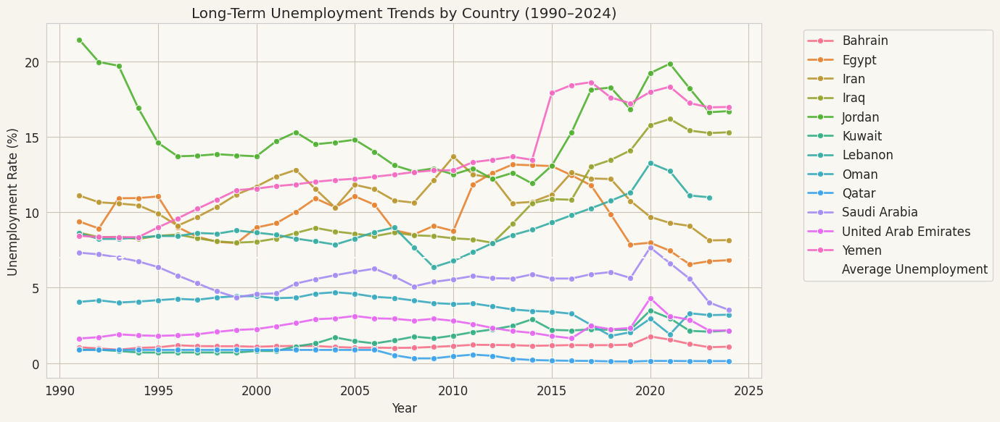

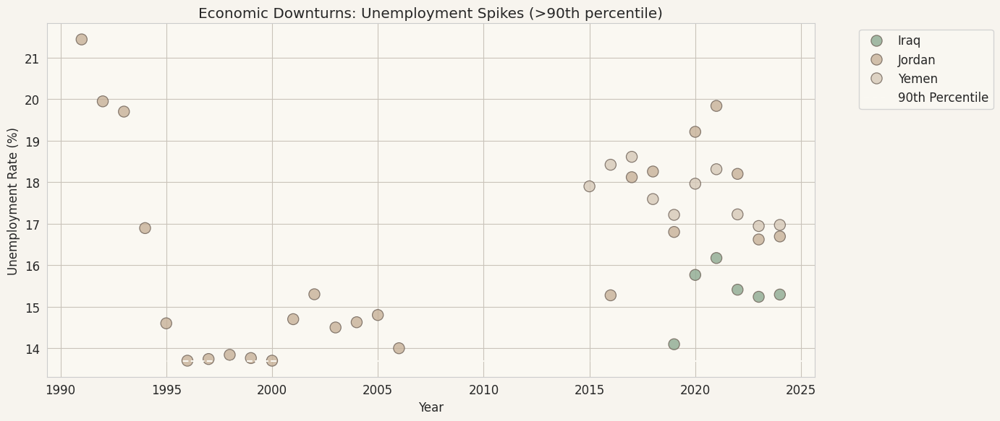

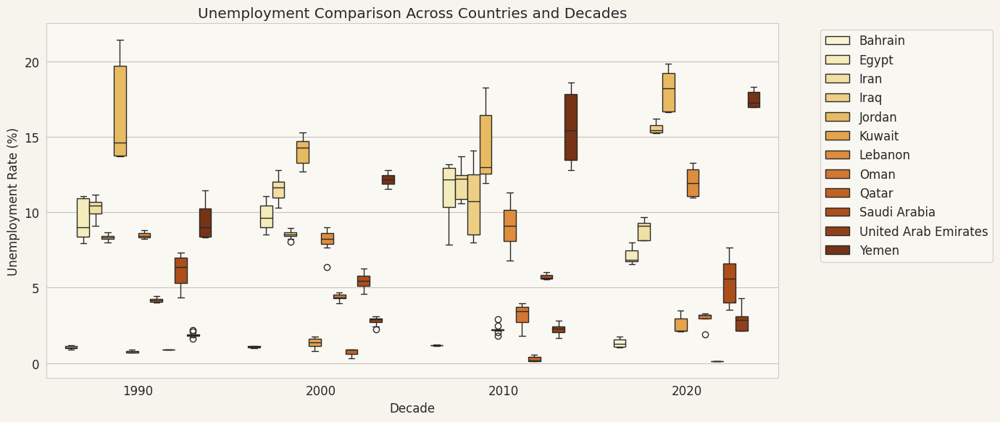

In [15]:
# ======================================================
# (A) LONG-TERM UNEMPLOYMENT TRENDS
# ======================================================
plt.figure(figsize=(14,6))
sns.lineplot(
    data=df_sorted,
    x="Year",
    y="Unemployment_total_pct",
    hue="Country",
    marker="o",
    linewidth=2,
    alpha=0.9
)
plt.title("Long-Term Unemployment Trends by Country (1990–2024)")
plt.ylabel("Unemployment Rate (%)")
plt.xlabel("Year")
plt.axhline(df_sorted["Unemployment_total_pct"].mean(), color="#FAF8F2", linestyle="--", linewidth=1.5, label="Average Unemployment")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# ======================================================
# (B) ECONOMIC DOWNTURNS VS UNEMPLOYMENT SPIKES
# ======================================================
# Highlight years where unemployment > 90th percentile (spikes)
high_unemp_threshold = df_sorted["Unemployment_total_pct"].quantile(0.90)
unemp_spikes = df_sorted[df_sorted["Unemployment_total_pct"] > high_unemp_threshold]

plt.figure(figsize=(14,6))
sns.scatterplot(
    data=unemp_spikes,
    x="Year",
    y="Unemployment_total_pct",
    hue="Country",
    s=120,
    alpha=0.8,
    edgecolor="#6B5E54"
)
plt.axhline(high_unemp_threshold, color="#FAF8F2", linestyle="--", linewidth=1.5, label="90th Percentile")
plt.title("Economic Downturns: Unemployment Spikes (>90th percentile)")
plt.ylabel("Unemployment Rate (%)")
plt.xlabel("Year")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# ======================================================
# (C) COMPARISON OF UNEMPLOYMENT ACROSS COUNTRIES AND DECADES
# ======================================================
# Add decade column
df_sorted["Decade"] = (df_sorted["Year"] // 10) * 10

plt.figure(figsize=(14,6))
sns.boxplot(
    data=df_sorted,
    x="Decade",
    y="Unemployment_total_pct",
    hue="Country",
    palette="YlOrBr"
)
plt.title("Unemployment Comparison Across Countries and Decades")
plt.ylabel("Unemployment Rate (%)")
plt.xlabel("Decade")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# **🔟 Correlation & Heatmap Insights**

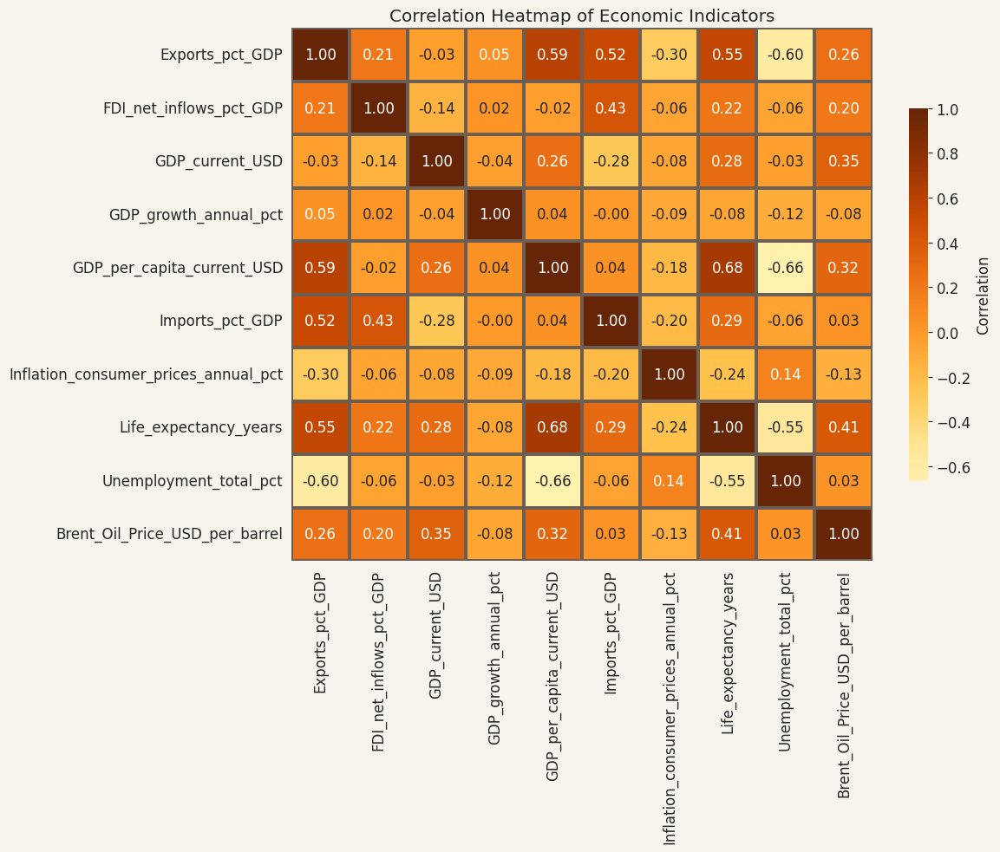

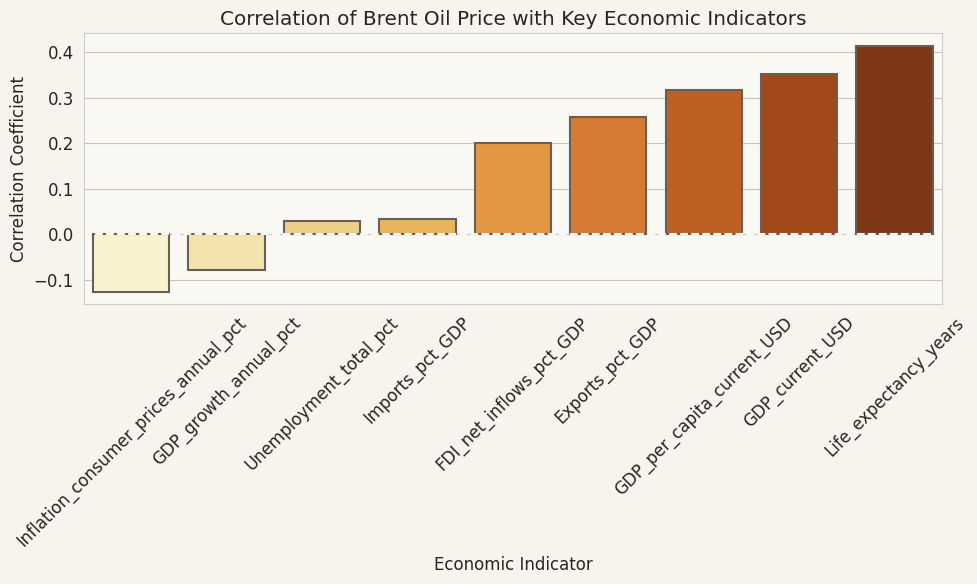

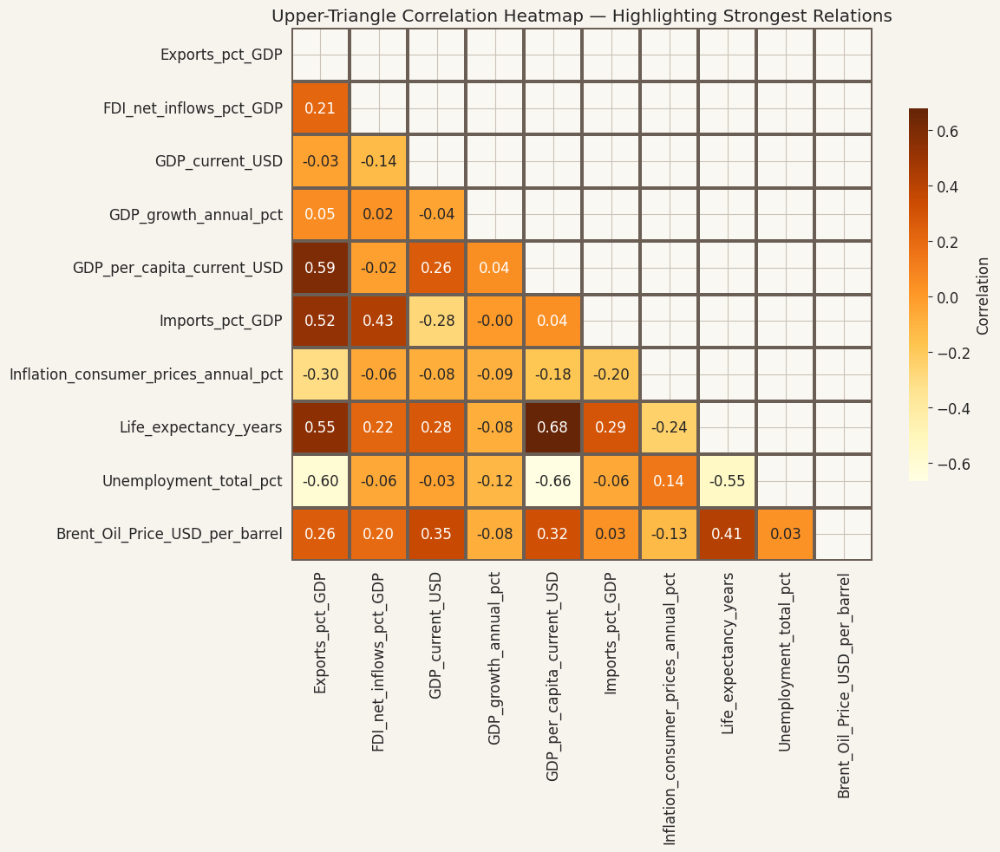

In [16]:
# Select only numeric columns for correlation
numeric_cols = [
    "Exports_pct_GDP",
    "FDI_net_inflows_pct_GDP",
    "GDP_current_USD",
    "GDP_growth_annual_pct",
    "GDP_per_capita_current_USD",
    "Imports_pct_GDP",
    "Inflation_consumer_prices_annual_pct",
    "Life_expectancy_years",
    "Unemployment_total_pct",
    "Brent_Oil_Price_USD_per_barrel"
]

corr_df = df[numeric_cols].corr()

# ======================================================
# (A) FULL CORRELATION HEATMAP
# ======================================================
plt.figure(figsize=(12,10))
sns.heatmap(
    corr_df,
    annot=True,
    fmt=".2f",
    cmap="YlOrBr",  # earth-tone theme
    center=0,
    linewidths=1.5,
    linecolor="#6B5E54",
    cbar_kws={"shrink":0.7, "label":"Correlation"}
)
plt.title("Correlation Heatmap of Economic Indicators")
plt.tight_layout()
plt.show()

# ======================================================
# (B) HIGHLIGHT BRENT OIL PRICE CORRELATIONS
# ======================================================
oil_corr = corr_df["Brent_Oil_Price_USD_per_barrel"].drop("Brent_Oil_Price_USD_per_barrel").sort_values()

plt.figure(figsize=(10,6))
sns.barplot(
    x=oil_corr.index,
    y=oil_corr.values,
    palette="YlOrBr",
    edgecolor="#6B5E54",
    linewidth=1.5
)
plt.title("Correlation of Brent Oil Price with Key Economic Indicators")
plt.ylabel("Correlation Coefficient")
plt.xlabel("Economic Indicator")
plt.xticks(rotation=45)
plt.axhline(0, color="#FAF8F2", linestyle="--", linewidth=1.5)
plt.tight_layout()
plt.show()

# ======================================================
# (C) HIGHLIGHT STRONGEST POSITIVE & NEGATIVE CORRELATIONS
# ======================================================
# Mask for upper triangle
mask = np.triu(np.ones_like(corr_df, dtype=bool))

plt.figure(figsize=(12,10))
sns.heatmap(
    corr_df,
    mask=mask,
    annot=True,
    fmt=".2f",
    cmap="YlOrBr",
    center=0,
    linewidths=1.5,
    linecolor="#6B5E54",
    cbar_kws={"shrink":0.7, "label":"Correlation"}
)
plt.title("Upper-Triangle Correlation Heatmap — Highlighting Strongest Relations")
plt.tight_layout()
plt.show()

# **1️⃣1️⃣ Country-wise Clustering**

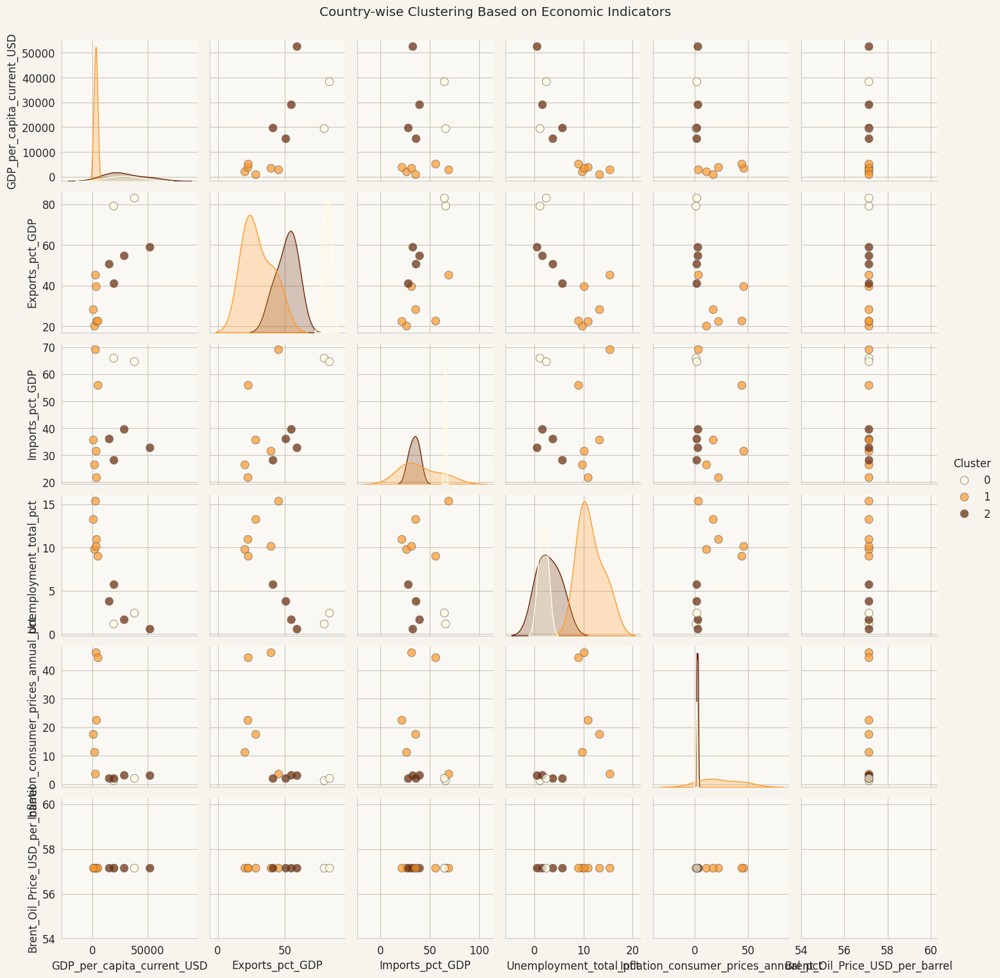

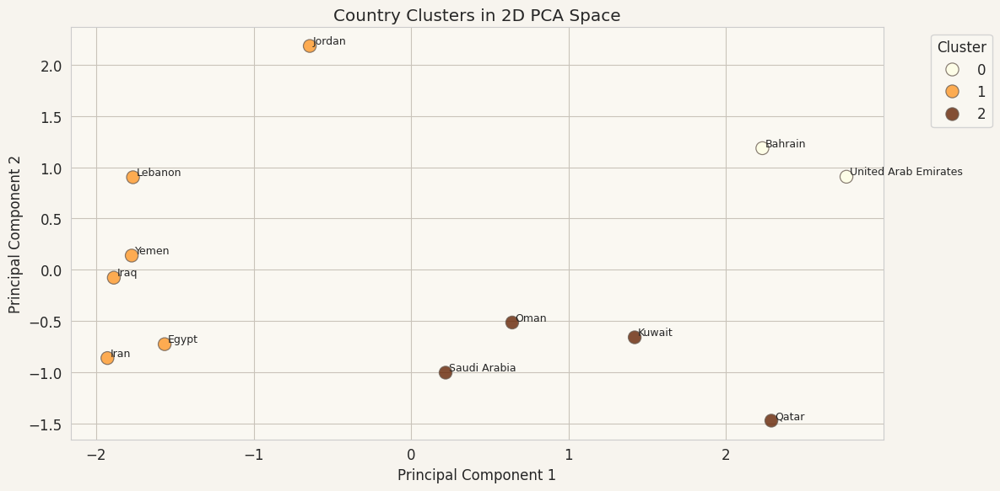

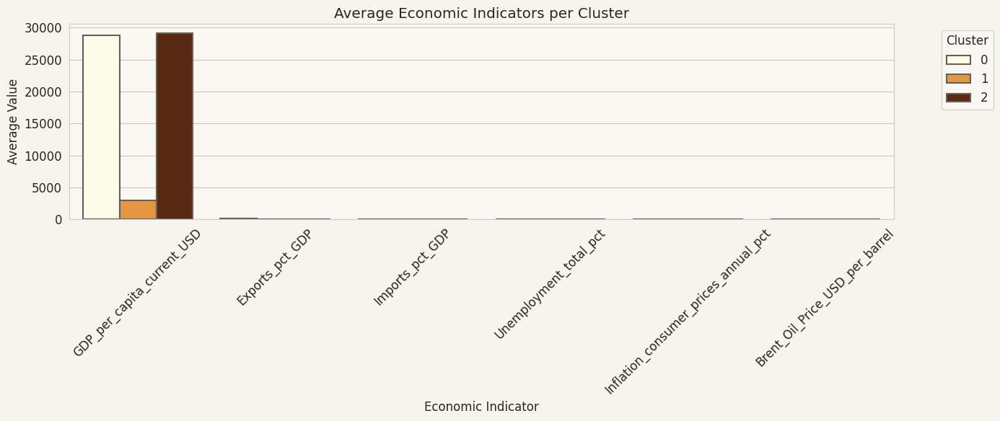

In [17]:
# Select key indicators for clustering
cluster_cols = [
    "GDP_per_capita_current_USD",
    "Exports_pct_GDP",
    "Imports_pct_GDP",
    "Unemployment_total_pct",
    "Inflation_consumer_prices_annual_pct",
    "Brent_Oil_Price_USD_per_barrel"
]

# Drop rows with missing values in clustering columns
cluster_df = df.groupby("Country")[cluster_cols].mean().reset_index().dropna()

# Standardize data
scaler = StandardScaler()
cluster_scaled = scaler.fit_transform(cluster_df[cluster_cols])

# Apply KMeans clustering (k=3 for oil-rich, diversified, conflict-affected)
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
cluster_df["Cluster"] = kmeans.fit_predict(cluster_scaled)

# ======================================================
# (A) PAIRWISE SCATTER PLOT TO VISUALIZE CLUSTERS
# ======================================================
sns.pairplot(
    cluster_df,
    vars=cluster_cols,
    hue="Cluster",
    palette="YlOrBr",
    diag_kind="kde",
    plot_kws={"alpha":0.7, "edgecolor":"#6B5E54", "s":80}
)
plt.suptitle("Country-wise Clustering Based on Economic Indicators", y=1.02)
plt.show()

# ======================================================
# (B) 2D PCA-STYLE CLUSTER VISUALIZATION (REDUCED DIMENSIONS)
# ======================================================
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
components = pca.fit_transform(cluster_scaled)
cluster_df["PC1"] = components[:,0]
cluster_df["PC2"] = components[:,1]

plt.figure(figsize=(12,6))
sns.scatterplot(
    data=cluster_df,
    x="PC1",
    y="PC2",
    hue="Cluster",
    palette="YlOrBr",
    s=120,
    alpha=0.8,
    edgecolor="#6B5E54"
)
for i, row in cluster_df.iterrows():
    plt.text(row["PC1"]+0.02, row["PC2"]+0.02, row["Country"], fontsize=9)
plt.title("Country Clusters in 2D PCA Space")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster", bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# ======================================================
# (C) BAR PLOT OF AVERAGE INDICATORS PER CLUSTER
# ======================================================
cluster_avg = cluster_df.groupby("Cluster")[cluster_cols].mean().reset_index()

cluster_avg_melt = cluster_avg.melt(id_vars="Cluster", var_name="Indicator", value_name="Average")

plt.figure(figsize=(14,6))
sns.barplot(
    data=cluster_avg_melt,
    x="Indicator",
    y="Average",
    hue="Cluster",
    palette="YlOrBr",
    edgecolor="#6B5E54",
    linewidth=1.5
)
plt.title("Average Economic Indicators per Cluster")
plt.xlabel("Economic Indicator")
plt.ylabel("Average Value")
plt.xticks(rotation=45)
plt.legend(title="Cluster", bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()

# **1️⃣2️⃣ Events & Anomaly Detection**

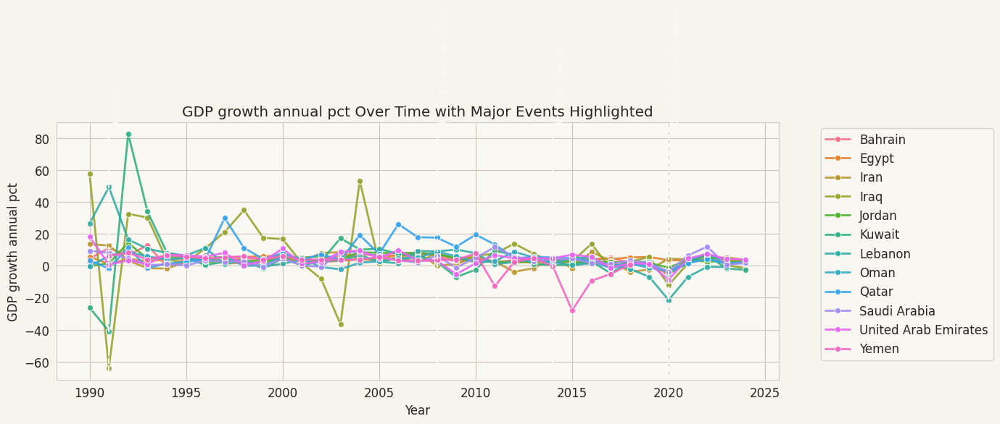

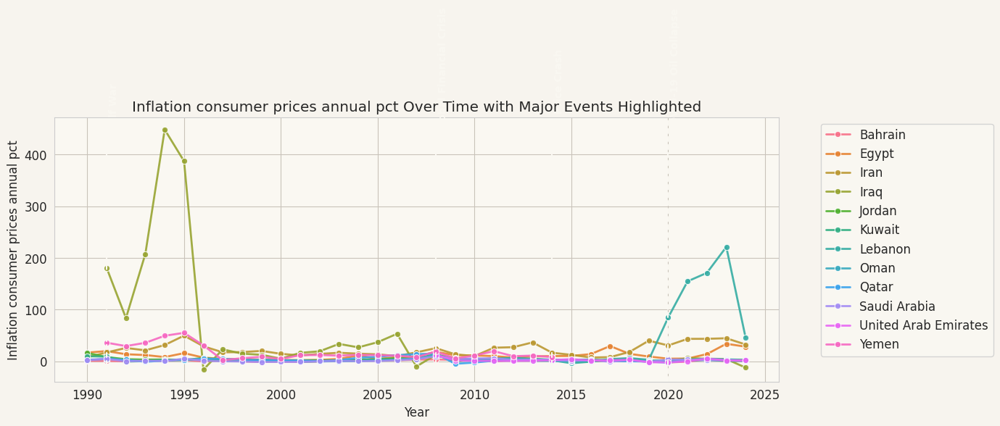

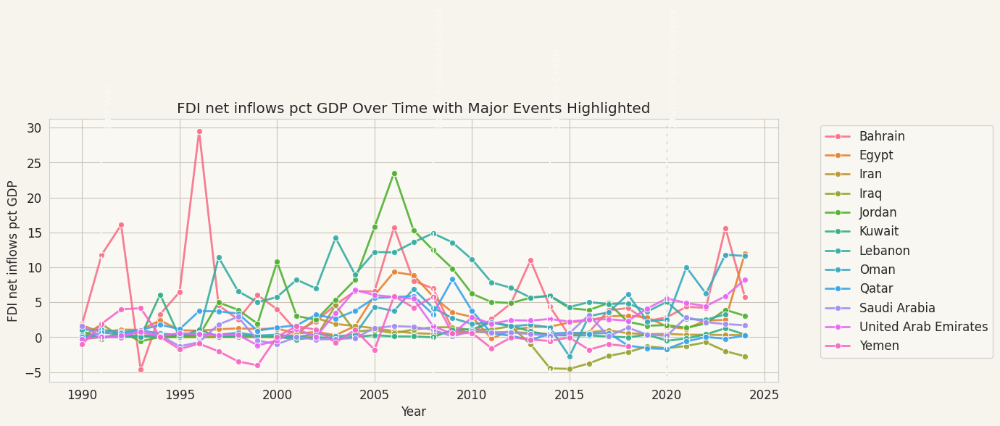

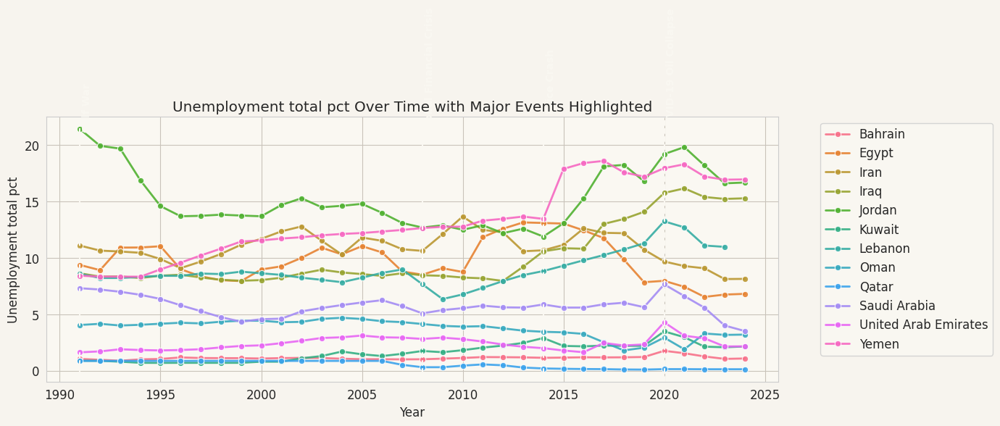

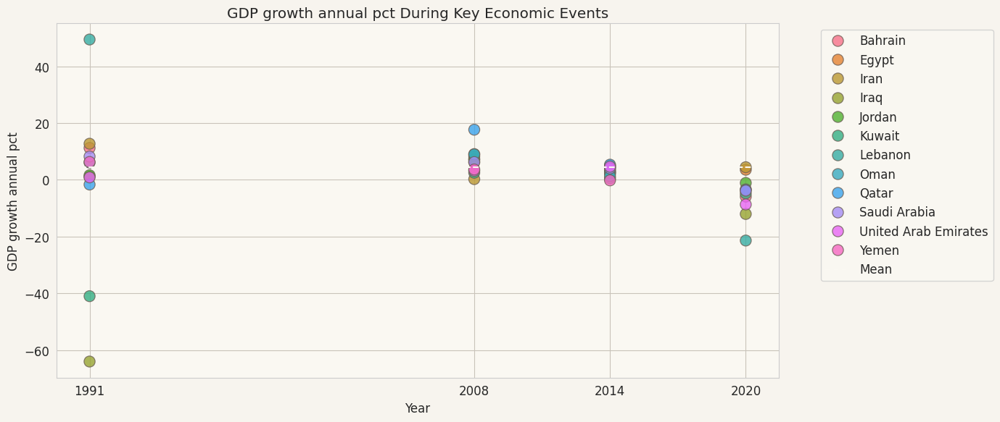

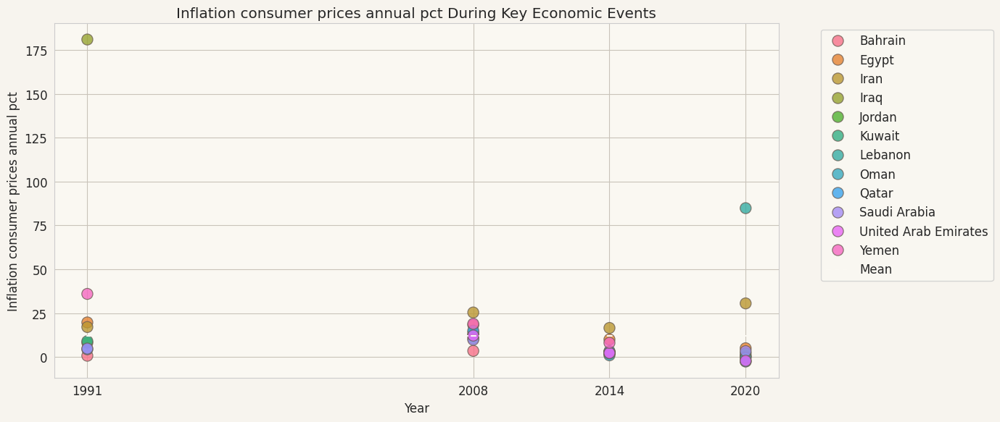

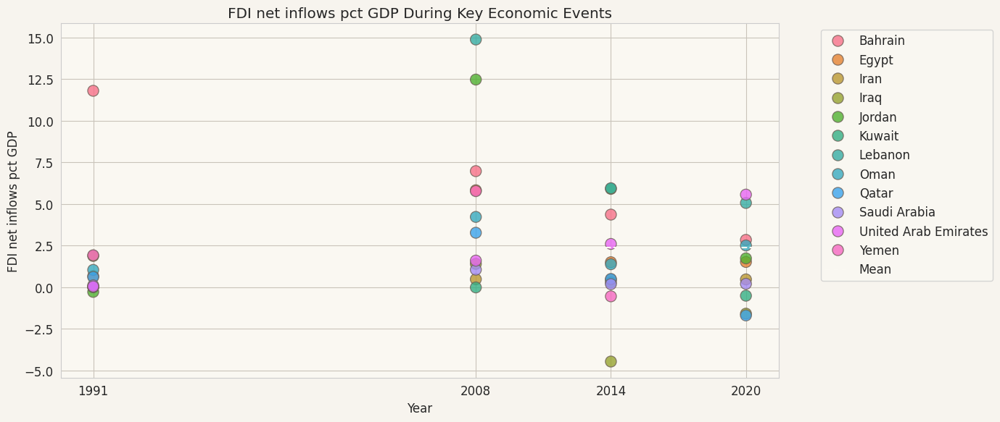

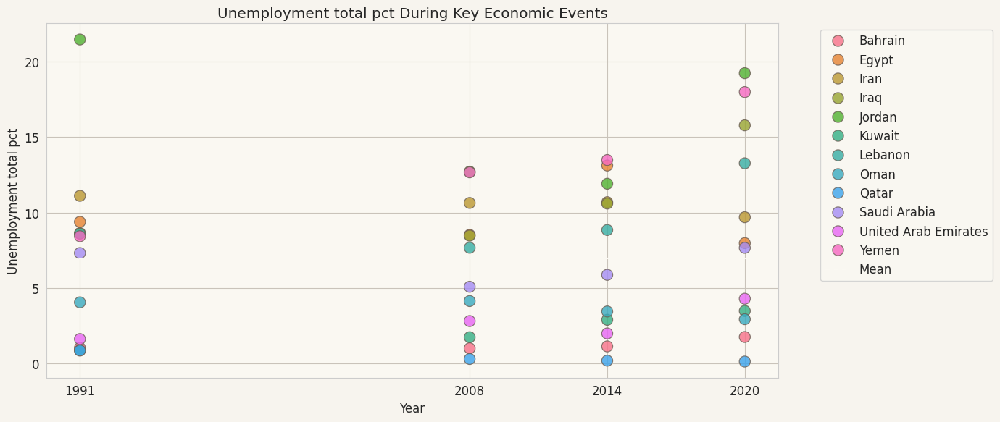

In [18]:
# Define event years and labels
events = {
    1991: "Gulf War",
    2008: "Global Financial Crisis",
    2014: "Oil Price Crash",
    2020: "COVID-19 Oil Collapse"
}

event_years = list(events.keys())

# List of key indicators to analyze
indicators = ["GDP_growth_annual_pct",
              "Inflation_consumer_prices_annual_pct",
              "FDI_net_inflows_pct_GDP",
              "Unemployment_total_pct"]

# ======================================================
# (A) TIME-SERIES PLOTS WITH EVENTS HIGHLIGHTED
# ======================================================
for ind in indicators:
    plt.figure(figsize=(14,6))
    sns.lineplot(
        data=df_sorted,
        x="Year",
        y=ind,
        hue="Country",
        marker="o",
        linewidth=2,
        alpha=0.9
    )
    
    # Highlight events
    for year, label in events.items():
        plt.axvline(year, color="#FAF8F2", linestyle="--", linewidth=1.5)
        plt.text(year+0.1, plt.ylim()[1]*0.95, label, rotation=90, color="#FAF8F2", fontsize=10, fontweight="bold")
    
    plt.title(f"{ind.replace('_',' ')} Over Time with Major Events Highlighted")
    plt.ylabel(ind.replace('_',' '))
    plt.xlabel("Year")
    plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
    plt.tight_layout()
    plt.show()

# ======================================================
# (B) SCATTER PLOTS FOR EVENTS VS ECONOMIC IMPACT
# ======================================================
for ind in indicators:
    plt.figure(figsize=(14,6))
    event_df = df_sorted[df_sorted["Year"].isin(event_years)]
    sns.scatterplot(
        data=event_df,
        x="Year",
        y=ind,
        hue="Country",
        s=120,
        alpha=0.8,
        edgecolor="#6B5E54"
    )
    plt.title(f"{ind.replace('_',' ')} During Key Economic Events")
    plt.ylabel(ind.replace('_',' '))
    plt.xlabel("Year")
    plt.xticks(event_years)
    plt.axhline(df_sorted[ind].mean(), color="#FAF8F2", linestyle="--", linewidth=1.5, label="Mean")
    plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
    plt.tight_layout()
    plt.show()

---

# **Thank You!**

Thank you for exploring this **Middle East Economy & Oil Prices Analysis** notebook!  
I hope this interactive and visually engaging analysis helps you **understand key economic trends, oil price impacts, and social development patterns** in the region.  

💡 **Feel free to explore further, modify the plots, and gain your own insights!**  

✨ **Stay curious and keep analyzing!**